# Comp1-传统组学

主要适配于传统组学的建模和刻画。典型的应用场景探究rad_score最最终临床诊断的作用。

数据的一般形式为(具体文件,文件夹名可以不同)：
1. `images`文件夹，存放研究对象所有的CT、MRI等数据。
2. `masks`文件夹, 存放手工（Manuelly）勾画的ROI区域。与images文件夹的文件意义对应。
3. `label.txt`文件，每个患者对应的标签，例如肿瘤的良恶性、5年存活状态等。

## Onekey步骤

1. 数据校验，检查数据格式是否正确。
2. 组学特征提取，如果第一步检查数据通过，则提取对应数据的特征。
3. 读取标注数据信息。
4. 特征与标注数据拼接。形成数据集。
5. 查看一些统计信息，检查数据时候存在异常点。
6. 正则化，将数据变化到服从 N~(0, 1)。
7. 通过相关系数，例如spearman、person等筛选出特征。
8. 构建训练集和测试集，这里使用的是随机划分，正常多中心验证，需要大家根据自己的场景构建两份数据。
9. 通过Lasso筛选特征，选取其中的非0项作为后续模型的特征。
10. 使用机器学习算法，例如LR、SVM、RF等进行任务学习。
11. 模型结果可视化，例如AUC、ROC曲线，混淆矩阵等。


In [1]:
## 获得视频教程
import os
from onekey_algo.custom.Manager import onekey_show
onekey_show('传统组学任务')

[2025-12-16 20:18:25 - <frozen onekey_algo.custom.Manager>: 159]	INFO	播放视频功能已经设置成：Disable！


## 一、数据校验
首先需要检查诊断数据，如果显示`检查通过！`择可以正常运行之后的，否则请根据提示调整数据。

**注意**：这里要求images和masks文件夹中的文件名必须一一对应。e.g. `1.nii.gz`为images中的一个文件，在masks文件夹必须也存在一个`1.nii.gz`文件。

当然也可以使用自定义的函数，获取解析数据。

In [2]:
# 数据检验视频
onekey_show('传统组学任务|数据检验')

[2025-12-16 20:18:25 - <frozen onekey_algo.custom.Manager>: 159]	INFO	播放视频功能已经设置成：Disable！


### 指定数据

此模块有3个需要自己定义的参数

1. `mydir`: 数据存放的路径。
2. `labelf`: 每个样本的标注信息文件。
3. `labels`: 要让AI系统学习的目标，例如肿瘤的良恶性、T-stage等。

In [3]:
import os
import pandas as pd
from IPython.display import display
os.environ['KMP_DUPLICATE_LIB_OK'] = 'TRUE'
from onekey_algo import OnekeyDS as okds
from onekey_algo import get_param_in_cwd

os.makedirs('img', exist_ok=True)
os.makedirs('results', exist_ok=True)
os.makedirs('features', exist_ok=True)

# 设置任务Task前缀
task_type = 'Habitat_'
# 设置数据目录
# mydir = r'你自己数据的路径'
mydir = get_param_in_cwd('radio_dir')
if mydir == okds.ct:
    print(f'正在使用Onekey数据：{okds.ct}，如果不符合预期，请修改目录位置！')
# 对应的标签文件
group_info = get_param_in_cwd('dataset_column') or 'group'
labelf = get_param_in_cwd('label_file') or 'group.csv'
# 读取标签数据列名
labels = [get_param_in_cwd('task_column')] or ['label']

### images和masks匹配

这里要求images和masks文件夹中的文件名必须一一对应。e.g. `1.nii.gz`为images中的一个文件，在masks文件夹必须也存在一个`1.nii.gz`文件。

当然也可以使用自定义的函数，获取解析数据。

In [4]:
from pathlib import Path
from onekey_algo.custom.components.Radiology import diagnose_3d_image_mask_settings, get_image_mask_from_dir

# 生成images和masks对，一对一的关系。也可以自定义替换。
images, masks = get_image_mask_from_dir(mydir, images=f'images', masks=get_param_in_cwd('habitat_dir'))
# diagnose_3d_image_mask_settings(images, masks, verbose=False)
print(f'获取到{len(images)}个样本。')

获取到812个样本。


# 传统组学特征

使用pyradiomics提取传统组学特征，正常这块不需要修改，下面是具体的Onekey封装的接口。

```python
def extract(self, images: Union[str, List[str]], 
            masks: Union[str, List[str]], labels: Union[int, List[int]] = 1, settings=None)
"""
    * images: List结构，待提取的图像列表。
    * masks: List结构，待提取的图像对应的mask，与Images必须一一对应。
    * labels: 提取标注为什么标签的特征。默认为提取label=1的。
    * settings: 其他提取特征的参数。默认为None。

"""
```

```python
def get_label_data_frame(self, label: int = 1, column_names=None, images='images', masks='labels')
"""
    * label: 获取对应label的特征。
    * columns_names: 默认为None，使用程序设定的列名即可。
"""
```
    
```python
def get_image_mask_from_dir(root, images='images', masks='labels')
"""
    * root: 待提取特征的目录。
    * images: root目录中原始数据的文件夹名。
    * masks: root目录中标注数据的文件夹名。
"""
```


In [5]:
# 特征提取视频
onekey_show('传统组学任务|特征提取')

[2025-12-16 20:18:25 - <frozen onekey_algo.custom.Manager>: 159]	INFO	播放视频功能已经设置成：Disable！


In [6]:
import warnings
import pandas as pd
import numpy as np
from onekey_algo.custom.components.Radiology import ConventionalRadiomics
from onekey_algo.custom.components.habitat import habitat_feature_fusion
 
warnings.filterwarnings("ignore")

rad_data = None
habitats = get_param_in_cwd('habitats')
rad_ = []
param_file = get_param_in_cwd('extractor_settings')
for habitat in habitats:
    if os.path.exists(f'features/rad_features_h{habitat}.csv'):
        rad_data_ = pd.read_csv(f'features/rad_features_h{habitat}.csv', header=0)
    else:
        images, masks = get_image_mask_from_dir(mydir, images=f'images', masks=get_param_in_cwd('habitat_dir'))
        radiomics = ConventionalRadiomics(param_file, correctMask=True)
        radiomics.extract(images, masks, workers=1, labels=habitat)
        rad_data_ = radiomics.get_label_data_frame(label=habitat)
        rad_data_.columns = [f"{c.replace('-', '_')}_h{habitat}" if c != 'ID' else 'ID' for c in rad_data_.columns]
        rad_data_.to_csv(f'features/rad_features_h{habitat}.csv', header=True, index=False)
    rad_.append(rad_data_)

rad_data = habitat_feature_fusion(*rad_, mode=get_param_in_cwd('fusion_mode'))
rad_data.to_csv('features/rad_features.csv', index=False)
rad_data

,ID,exponential_firstorder_10Percentile_h1,exponential_firstorder_90Percentile_h1,exponential_firstorder_Energy_h1,exponential_firstorder_Entropy_h1,exponential_firstorder_InterquartileRange_h1,exponential_firstorder_Kurtosis_h1,exponential_firstorder_Maximum_h1,exponential_firstorder_Mean_h1,exponential_firstorder_MeanAbsoluteDeviation_h1,...,wavelet_LLL_glszm_SmallAreaHighGrayLevelEmphasis_h4,wavelet_LLL_glszm_SmallAreaLowGrayLevelEmphasis_h4,wavelet_LLL_glszm_ZoneEntropy_h4,wavelet_LLL_glszm_ZonePercentage_h4,wavelet_LLL_glszm_ZoneVariance_h4,wavelet_LLL_ngtdm_Busyness_h4,wavelet_LLL_ngtdm_Coarseness_h4,wavelet_LLL_ngtdm_Complexity_h4,wavelet_LLL_ngtdm_Contrast_h4,wavelet_LLL_ngtdm_Strength_h4
0,1.nii.gz,1.069,101.944,1.402e+08,2.170,8.088,91.589,4511.804,76.303,124.809,...,70042.835,0.013,6.076,1.000,0.000,4.780e-03,0.019,5.092e+05,357.831,1606.590
1,10.nii.gz,0.861,11.971,9.103e+06,1.224,8.364,2.266,15.880,5.709,4.464,...,68690.182,0.031,4.984,1.000,0.000,1.407e-02,0.014,3.431e+05,2932.177,1212.745
2,100.nii.gz,1.820,18.452,6.580e+07,2.310,10.420,19.744,151.913,13.665,12.550,...,104558.778,0.015,6.065,0.986,0.014,5.531e-03,0.014,8.089e+05,632.827,1291.351
3,1001.nii.gz,3.215,205.650,8.879e+07,3.293,45.325,11.972,1826.080,148.700,220.748,...,794766.579,0.005,7.406,1.000,0.000,1.329e-03,0.010,6.713e+06,813.094,5498.647
4,1003.nii.gz,1.906,107.412,8.278e+08,3.940,33.667,148.626,2470.583,48.851,57.520,...,534058.344,0.002,8.720,0.995,0.005,5.784e-04,0.008,1.922e+07,145.857,8794.366
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
807,98.nii.gz,0.784,4.482,3.845e+07,0.176,1.496,35.800,138.261,5.724,6.976,...,50126.000,0.038,4.755,1.000,0.000,1.032e-02,0.029,1.144e+05,1198.330,1409.241
808,980.nii.gz,3.336,232.706,6.908e+08,4.491,58.653,60.079,2963.270,98.838,123.745,...,554634.861,0.002,8.692,0.995,0.005,5.714e-04,0.009,1.672e+07,133.857,9217.991
809,981.nii.gz,1.996,14.878,1.288e+08,1.795,5.510,11.130,43.948,6.915,4.791,...,395175.013,0.004,7.721,0.996,0.004,7.660e-04,0.015,5.007e+06,307.630,9224.244
810,984.nii.gz,6.166,131.670,1.640e+07,2.423,35.283,4.436,212.754,43.981,48.386,...,288019.306,0.014,6.142,0.986,0.014,2.787e-03,0.014,1.889e+06,2830.011,5741.377


## 特征统计

,feature_group,count
1,firstorder,1224
0,glcm,1496
4,gldm,952
2,glrlm,1088
3,glszm,1088
5,ngtdm,340
6,shape,56


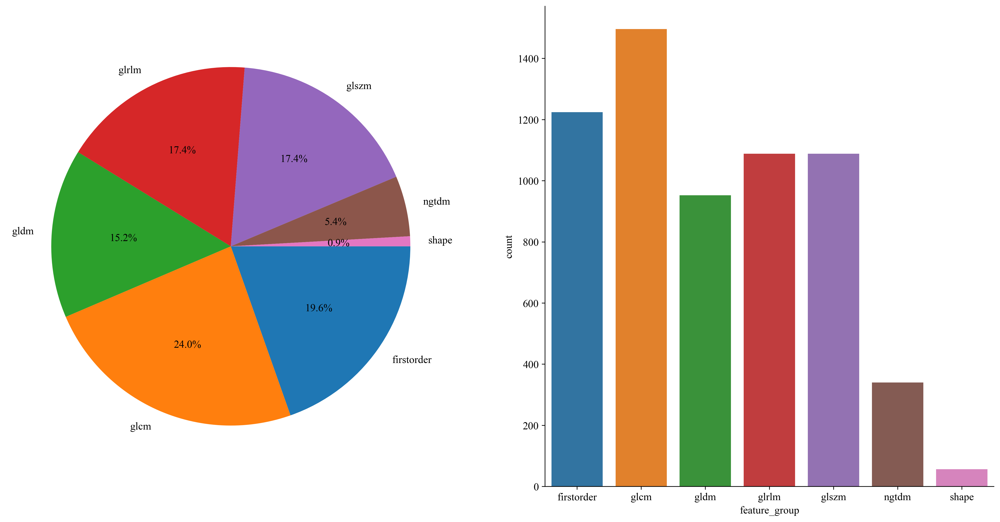

In [7]:
import matplotlib.pyplot as plt
import seaborn as sns
sorted_counts = pd.DataFrame([c.split('_')[-3] for c in rad_data.columns if c !='ID']).value_counts()
sorted_counts = pd.DataFrame(sorted_counts, columns=['count']).reset_index()
sorted_counts = sorted_counts.sort_values(0)
sorted_counts.columns = ['feature_group', 'count']
display(sorted_counts)

plt.figure(figsize=(20, 10))
ax = plt.subplot(121)
plt.pie(sorted_counts['count'], labels=[i for i in sorted_counts['feature_group']], startangle=0,
        counterclock = False, autopct = '%.1f%%')
# plt.bar_label(bar.containers[0])
ax = plt.subplot(122)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
bar = sns.barplot(data=sorted_counts, x='feature_group', y='count', )
plt.savefig(f'img/{task_type}feature_ratio.svg', bbox_inches = 'tight')

## 标注数据

数据以csv格式进行存储，这里如果是其他格式，可以使用自定义函数读取出每个样本的结果。

要求label_data为一个`DataFrame`格式，包括ID列以及后续的labels列，可以是多列，支持Multi-Task。

In [8]:
group_info = 'group'
label_data = pd.read_csv(labelf)
label_data['ID'] = label_data['ID'].map(lambda x: f"{x}.nii.gz" if not (f"{x}".endswith('.nii.gz') or  f"{x}".endswith('.nii')) else x)
label_data = label_data[['ID', group_info] + labels]
label_data

,ID,group,label
0,1.nii.gz,train,0
1,100.nii.gz,val,1
2,1001.nii.gz,train,0
3,1003.nii.gz,train,1
4,101.nii.gz,val,0
...,...,...,...
755,978.nii.gz,train,0
756,980.nii.gz,train,1
757,981.nii.gz,train,1
758,984.nii.gz,train,1


## 特征拼接 

将标注数据`label_data`与`rad_data`进行合并，得到训练数据。

**注意：** 
1. 需要删掉ID这一列
2. 如果发现数据少了，需要自行检查数据是否匹配。

In [9]:
# 删掉ID这一列。
from onekey_algo.custom.utils import print_join_info
print_join_info(rad_data, label_data)
combined_data = pd.merge(rad_data, label_data, on=['ID'], how='inner')
# combined_data[['ID'] + selected_features[0]].to_csv('features/sel_habitat.csv', index=False)
ids = combined_data['ID']
combined_data = combined_data.drop(['ID'], axis=1)
display(combined_data[labels].value_counts())
display(combined_data[group_info].value_counts())
combined_data

[2025-12-16 20:18:34 - <frozen onekey_algo.custom.utils>:  63]	WARNING	存在ID特征不完全匹配的问题！在左边不在右边的ID：['10.nii.gz', '102.nii.gz', '1021.nii.gz', '1022.nii.gz', '1041.nii.gz', '1075.nii.gz', '1090.nii.gz', '1108.nii.gz', '1115.nii.gz', '1209.nii.gz', '122.nii.gz', '1228.nii.gz', '1258.nii.gz', '130.nii.gz', '1304.nii.gz', '1335.nii.gz', '1338.nii.gz', '1355.nii.gz', '1365.nii.gz', '1388.nii.gz', '1399.nii.gz', '1406.nii.gz', '1407.nii.gz', '146.nii.gz', '170.nii.gz', '171.nii.gz', '178.nii.gz', '191.nii.gz', '204.nii.gz', '258.nii.gz', '300.nii.gz', '31.nii.gz', '350.nii.gz', '41.nii.gz', '42.nii.gz', '519.nii.gz', '527.nii.gz', '560.nii.gz', '587.nii.gz', '609.nii.gz', '682.nii.gz', '727.nii.gz', '768.nii.gz', '783.nii.gz', '796.nii.gz', '834.nii.gz', '874.nii.gz', '876.nii.gz', '882.nii.gz', '883.nii.gz', '96.nii.gz', '98.nii.gz']；在右边不在左边的ID：[]


label
1        386
0        374
dtype: int64

train    442
val      187
test     131
Name: group, dtype: int64

,exponential_firstorder_10Percentile_h1,exponential_firstorder_90Percentile_h1,exponential_firstorder_Energy_h1,exponential_firstorder_Entropy_h1,exponential_firstorder_InterquartileRange_h1,exponential_firstorder_Kurtosis_h1,exponential_firstorder_Maximum_h1,exponential_firstorder_Mean_h1,exponential_firstorder_MeanAbsoluteDeviation_h1,exponential_firstorder_Median_h1,...,wavelet_LLL_glszm_ZoneEntropy_h4,wavelet_LLL_glszm_ZonePercentage_h4,wavelet_LLL_glszm_ZoneVariance_h4,wavelet_LLL_ngtdm_Busyness_h4,wavelet_LLL_ngtdm_Coarseness_h4,wavelet_LLL_ngtdm_Complexity_h4,wavelet_LLL_ngtdm_Contrast_h4,wavelet_LLL_ngtdm_Strength_h4,group,label
0,1.069,101.944,1.402e+08,2.170,8.088,91.589,4511.804,76.303,124.809,3.003,...,6.076,1.000,0.000,4.780e-03,0.019,5.092e+05,357.831,1606.590,train,0
1,1.820,18.452,6.580e+07,2.310,10.420,19.744,151.913,13.665,12.550,6.267,...,6.065,0.986,0.014,5.531e-03,0.014,8.089e+05,632.827,1291.351,val,1
2,3.215,205.650,8.879e+07,3.293,45.325,11.972,1826.080,148.700,220.748,8.167,...,7.406,1.000,0.000,1.329e-03,0.010,6.713e+06,813.094,5498.647,train,0
3,1.906,107.412,8.278e+08,3.940,33.667,148.626,2470.583,48.851,57.520,11.963,...,8.720,0.995,0.005,5.784e-04,0.008,1.922e+07,145.857,8794.366,train,1
4,3.385,124.178,1.191e+08,3.920,40.599,9.354,385.726,47.649,48.067,16.412,...,6.226,1.000,0.000,3.329e-03,0.015,1.091e+06,1002.134,3262.059,val,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
755,4.438,33.360,3.218e+07,2.971,16.255,9.467,83.450,18.765,10.910,17.558,...,5.044,1.000,0.000,6.700e-03,0.018,4.224e+05,5364.820,3632.016,train,0
756,3.336,232.706,6.908e+08,4.491,58.653,60.079,2963.270,98.838,123.745,21.317,...,8.692,0.995,0.005,5.714e-04,0.009,1.672e+07,133.857,9217.991,train,1
757,1.996,14.878,1.288e+08,1.795,5.510,11.130,43.948,6.915,4.791,4.410,...,7.721,0.996,0.004,7.660e-04,0.015,5.007e+06,307.630,9224.244,train,1
758,6.166,131.670,1.640e+07,2.423,35.283,4.436,212.754,43.981,48.386,11.954,...,6.142,0.986,0.014,2.787e-03,0.014,1.889e+06,2830.011,5741.377,train,1


## 获取到数据的统计信息

1. count，统计样本个数。
2. mean、std, 对应特征的均值、方差
3. min, 25%, 50%, 75%, max，对应特征的最小值，25,50,75分位数，最大值。

In [10]:
combined_data.describe()

,exponential_firstorder_10Percentile_h1,exponential_firstorder_90Percentile_h1,exponential_firstorder_Energy_h1,exponential_firstorder_Entropy_h1,exponential_firstorder_InterquartileRange_h1,exponential_firstorder_Kurtosis_h1,exponential_firstorder_Maximum_h1,exponential_firstorder_Mean_h1,exponential_firstorder_MeanAbsoluteDeviation_h1,exponential_firstorder_Median_h1,...,wavelet_LLL_glszm_SmallAreaLowGrayLevelEmphasis_h4,wavelet_LLL_glszm_ZoneEntropy_h4,wavelet_LLL_glszm_ZonePercentage_h4,wavelet_LLL_glszm_ZoneVariance_h4,wavelet_LLL_ngtdm_Busyness_h4,wavelet_LLL_ngtdm_Coarseness_h4,wavelet_LLL_ngtdm_Complexity_h4,wavelet_LLL_ngtdm_Contrast_h4,wavelet_LLL_ngtdm_Strength_h4,label
count,760.000,760.000,7.600e+02,7.600e+02,760.000,760.000,760.000,760.000,760.000,760.000,...,7.600e+02,760.000,760.000,760.000,7.600e+02,760.000,7.600e+02,7.600e+02,760.000,760.000
mean,2.209,89.441,2.862e+08,2.461e+00,23.492,48.718,1214.545,45.011,58.329,9.378,...,1.581e-02,6.839,0.994,0.006,4.567e-03,3947.387,3.544e+06,4.174e+03,5005.940,0.508
std,3.691,208.526,5.175e+08,1.331e+00,43.496,70.606,1661.397,69.133,99.775,13.148,...,3.086e-02,1.486,0.008,0.009,1.611e-02,62745.253,6.332e+06,5.624e+04,4451.155,0.500
min,0.043,0.508,2.003e+06,-3.203e-16,0.015,1.000,0.790,0.260,0.015,0.127,...,2.568e-04,1.585,0.913,0.000,0.000e+00,0.003,0.000e+00,0.000e+00,0.000,0.000
25%,0.718,13.169,5.272e+07,1.511e+00,4.514,12.042,66.384,7.397,6.673,2.695,...,3.079e-03,6.037,0.990,0.000,7.873e-04,0.013,5.102e+05,6.998e+01,2157.759,0.000
50%,1.524,32.202,1.262e+08,2.420e+00,10.447,27.314,354.517,18.816,20.180,5.609,...,7.122e-03,6.940,0.996,0.004,1.625e-03,0.017,1.511e+06,2.065e+02,3819.361,1.000
75%,2.563,94.332,3.103e+08,3.469e+00,27.250,54.797,1972.169,55.612,71.799,11.592,...,1.451e-02,7.877,1.000,0.010,3.551e-03,0.022,3.587e+06,9.613e+02,6484.555,1.000
max,79.631,3887.736,7.785e+09,5.845e+00,781.520,789.126,8595.781,965.531,1446.639,153.011,...,3.337e-01,10.223,1.000,0.086,3.588e-01,1000000.000,6.018e+07,1.529e+06,50131.415,1.000


## 正则化

`normalize_df` 为onekey中正则化的API，将数据变化到0均值1方差。正则化的方法为

$column = \frac{column - mean}{std}$

In [11]:
from onekey_algo.custom.components.comp1 import normalize_df
data = normalize_df(combined_data, not_norm=labels, group=group_info, use_train=True, verbose=True)
data = data.dropna(axis=1)
data.describe()

[2025-12-16 20:18:41 - <frozen onekey_algo.custom.components.comp1>: 244]	INFO	正在使用训练集预定数据进行标准化。


,exponential_firstorder_10Percentile_h1,exponential_firstorder_90Percentile_h1,exponential_firstorder_Energy_h1,exponential_firstorder_Entropy_h1,exponential_firstorder_InterquartileRange_h1,exponential_firstorder_Kurtosis_h1,exponential_firstorder_Maximum_h1,exponential_firstorder_Mean_h1,exponential_firstorder_MeanAbsoluteDeviation_h1,exponential_firstorder_Median_h1,...,wavelet_LLL_glszm_SmallAreaLowGrayLevelEmphasis_h4,wavelet_LLL_glszm_ZoneEntropy_h4,wavelet_LLL_glszm_ZonePercentage_h4,wavelet_LLL_glszm_ZoneVariance_h4,wavelet_LLL_ngtdm_Busyness_h4,wavelet_LLL_ngtdm_Coarseness_h4,wavelet_LLL_ngtdm_Complexity_h4,wavelet_LLL_ngtdm_Contrast_h4,wavelet_LLL_ngtdm_Strength_h4,label
count,760.000,760.000,760.000,760.000,760.000,760.000,760.000,760.000,760.000,760.000,...,760.000,760.000,760.000,760.000,760.000,760.000,760.000,760.000,760.000,760.000
mean,0.018,-0.035,0.119,0.119,-0.004,0.040,0.028,-0.024,-0.031,0.030,...,-0.007,0.040,0.027,-0.021,0.053,-0.009,0.024,0.154,0.024,0.508
std,0.842,0.810,1.408,0.969,0.846,0.971,1.018,0.868,0.867,0.920,...,1.032,1.013,0.904,0.922,1.798,0.934,1.006,4.848,0.960,0.500
min,-0.477,-0.380,-0.654,-1.672,-0.461,-0.616,-0.715,-0.585,-0.538,-0.617,...,-0.526,-3.542,-8.783,-0.711,-0.457,-0.067,-0.540,-0.206,-1.056,0.000
25%,-0.323,-0.331,-0.516,-0.572,-0.374,-0.464,-0.675,-0.496,-0.480,-0.437,...,-0.432,-0.506,-0.350,-0.711,-0.369,-0.067,-0.458,-0.200,-0.591,0.000
50%,-0.139,-0.257,-0.316,0.090,-0.258,-0.254,-0.498,-0.353,-0.363,-0.233,...,-0.297,0.109,0.237,-0.244,-0.276,-0.067,-0.299,-0.188,-0.232,1.000
75%,0.098,-0.016,0.185,0.854,0.069,0.123,0.493,0.109,0.086,0.185,...,-0.050,0.748,0.709,0.343,-0.061,-0.067,0.030,-0.123,0.343,1.000
max,17.682,14.715,20.517,2.583,14.747,10.221,4.551,11.531,12.036,10.075,...,10.623,2.348,0.709,8.595,39.590,14.816,9.021,131.561,9.755,1.000


## 统计检验

通过ttest或者utest进行特征筛选。

**注意** ：此步骤不是论文的标配，所以用不用在自己的选择，可以通过修改pvalue的值进行调整，默认是0.05为显著。

In [12]:
import seaborn as sns
from onekey_algo.custom.components.stats import clinic_stats

sub_data = data[data[group_info] == 'train']
stats = clinic_stats(sub_data, stats_columns=list(data.columns[0:-2]), label_column=labels[0], 
                     continuous_columns=list(data.columns[0:-2]))
stats

,feature_name,-label=ALL,-label=0,-label=1,pvalue
0,exponential_firstorder_10Percentile_h1,0.00±1.00,-0.07±0.50,0.07±1.32,0.199
1,exponential_firstorder_90Percentile_h1,-0.00±1.00,-0.04±0.77,0.04±1.19,0.032
2,exponential_firstorder_Energy_h1,0.00±1.00,-0.24±0.63,0.24±1.22,<0.001
3,exponential_firstorder_Entropy_h1,0.00±1.00,-0.14±0.97,0.14±1.01,0.003
4,exponential_firstorder_InterquartileRange_h1,-0.00±1.00,-0.07±0.73,0.07±1.21,0.01
...,...,...,...,...,...
6221,wavelet_LLL_ngtdm_Busyness_h4,-0.00±1.00,0.15±1.29,-0.15±0.55,<0.001
6222,wavelet_LLL_ngtdm_Coarseness_h4,0.00±1.00,0.07±1.41,-0.07±0.00,<0.001
6223,wavelet_LLL_ngtdm_Complexity_h4,0.00±1.00,-0.26±0.45,0.26±1.29,<0.001
6224,wavelet_LLL_ngtdm_Contrast_h4,-0.00±1.00,0.08±1.26,-0.08±0.63,<0.001


#### 输出特征分布的图

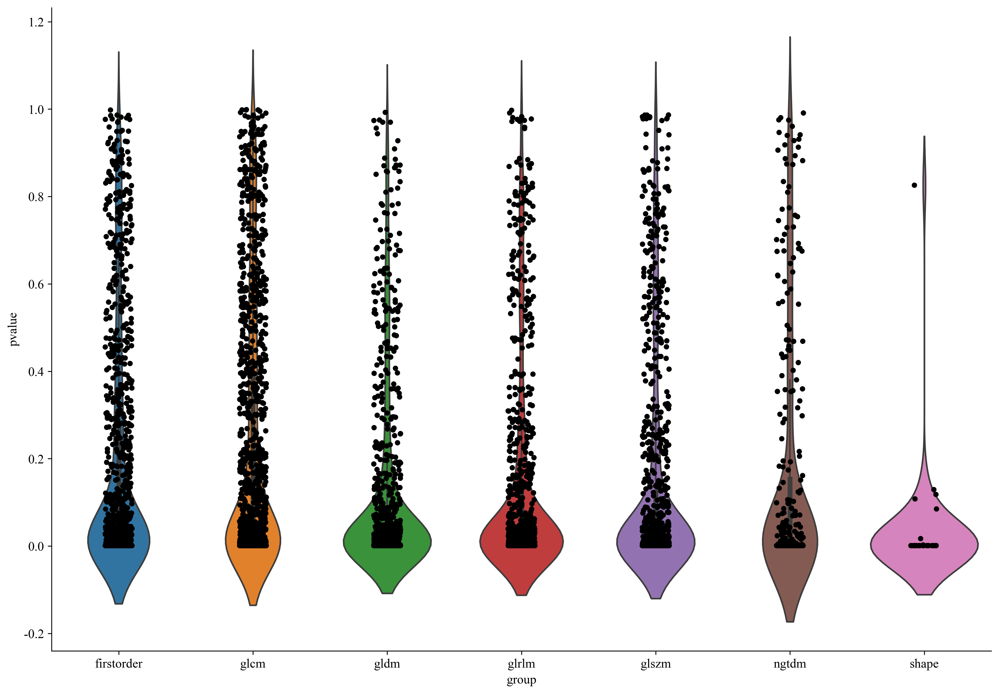

In [13]:
import matplotlib.pyplot as plt

def map2float(x):
    try:
        return float(str(x)[1:])
    except:
        return 1

stats[['pvalue']] = stats[['pvalue']].applymap(map2float)
stats[['group']] = stats[['feature_name']].applymap(lambda x: x.split('_')[-3])
stats = stats[['feature_name', 'pvalue', 'group']]
g = sns.catplot(x="group", y="pvalue", data=stats, kind="violin")
g.fig.set_size_inches(15,10)
sns.stripplot(x="group", y="pvalue", data=stats, ax=g.ax, color='black')
plt.savefig(f'img/{task_type}Rad_feature_stats.svg', bbox_inches = 'tight')

#### 调整pvalue进行筛选。

In [14]:
pvalue = 0.05
sel_feature = list(stats[stats['pvalue'] < pvalue]['feature_name']) + labels + [group_info]
sub_data = sub_data[sel_feature]
sub_data

,exponential_firstorder_90Percentile_h1,exponential_firstorder_Energy_h1,exponential_firstorder_Entropy_h1,exponential_firstorder_InterquartileRange_h1,exponential_firstorder_Kurtosis_h1,exponential_firstorder_Maximum_h1,exponential_firstorder_Mean_h1,exponential_firstorder_MeanAbsoluteDeviation_h1,exponential_firstorder_Median_h1,exponential_firstorder_Range_h1,...,wavelet_LLL_glszm_ZoneEntropy_h4,wavelet_LLL_glszm_ZonePercentage_h4,wavelet_LLL_glszm_ZoneVariance_h4,wavelet_LLL_ngtdm_Busyness_h4,wavelet_LLL_ngtdm_Coarseness_h4,wavelet_LLL_ngtdm_Complexity_h4,wavelet_LLL_ngtdm_Contrast_h4,wavelet_LLL_ngtdm_Strength_h4,label,group
0,0.014,-0.278,-0.092,-0.304,0.629,2.049,0.369,0.547,-0.416,2.049,...,-0.480,0.709,-0.711,0.076,-0.067,-0.459,-0.175,-0.709,0,train
2,0.416,-0.418,0.726,0.421,-0.465,0.403,1.278,1.381,-0.055,0.403,...,0.427,0.709,-0.711,-0.309,-0.067,0.527,-0.136,0.130,0,train
3,0.035,1.592,1.197,0.194,1.414,0.798,0.025,-0.038,0.211,0.798,...,1.323,0.180,-0.187,-0.393,-0.067,2.515,-0.193,0.841,1,train
6,-0.368,-0.567,-1.300,-0.439,-0.487,-0.706,-0.563,-0.519,-0.573,-0.705,...,0.020,-0.070,0.060,-0.273,-0.067,-0.416,-0.195,-0.485,0,train
8,1.503,0.789,1.850,1.019,-0.331,1.411,1.896,1.849,1.150,1.411,...,0.641,-0.200,0.189,-0.402,-0.067,0.240,-0.177,2.321,1,train
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
755,-0.253,-0.572,0.491,-0.145,-0.500,-0.665,-0.353,-0.443,0.602,-0.665,...,-1.183,0.709,-0.711,0.291,-0.067,-0.472,0.257,-0.273,0,train
756,0.521,1.220,1.597,0.680,0.196,1.100,0.652,0.537,0.865,1.100,...,1.304,0.170,-0.178,-0.393,-0.067,2.117,-0.194,0.932,1,train
757,-0.325,-0.309,-0.365,-0.354,-0.477,-0.689,-0.502,-0.497,-0.317,-0.689,...,0.642,0.280,-0.286,-0.372,-0.067,0.256,-0.179,0.933,1,train
758,0.129,-0.615,0.092,0.225,-0.569,-0.585,-0.037,-0.118,0.210,-0.588,...,-0.435,-0.786,0.768,-0.146,-0.067,-0.239,0.038,0.182,1,train


### 相关系数

计算相关系数的方法有3种可供选择
1. pearson （皮尔逊相关系数）: standard correlation coefficient

2. kendall (肯德尔相关性系数) : Kendall Tau correlation coefficient

3. spearman (斯皮尔曼相关性系数): Spearman rank correlation

三种相关系数参考：https://blog.csdn.net/zmqsdu9001/article/details/82840332

In [15]:
# 相关系数视频
onekey_show('传统组学任务|相关系数')

[2025-12-16 20:21:08 - <frozen onekey_algo.custom.Manager>: 159]	INFO	播放视频功能已经设置成：Disable！


In [16]:
pearson_corr = sub_data[[c for c in sub_data.columns if c not in labels]].corr('pearson')
# kendall_corr = data[[c for c in data.columns if c not in labels]].corr('kendall')
# spearman_corr = data[[c for c in data.columns if c not in labels]].corr('spearman')

### 相关系数可视化

通过修改变量名，可以可视化不同相关系数下的相关矩阵。

**注意**：当特征特别多的时候（大于100），尽量不要可视化，否则运行时间会特别长。

In [17]:
import seaborn as sns
from onekey_algo.custom.components.comp1 import draw_matrix

if data.shape[1] < 100:
    plt.figure(figsize=(50.0, 40.0))

    # 选择可视化的相关系数
    draw_matrix(pearson_corr, annot=True, cmap='YlGnBu', cbar=False)
    plt.savefig(f'img/{task_type}Rad_feature_corr.svg', bbox_inches = 'tight')

### 聚类分析

通过修改变量名，可以可视化不同相关系数下的相聚类分析矩阵。

注意：当特征特别多的时候（大于100），尽量不要可视化，否则运行时间会特别长。

In [18]:
import seaborn as sns
import matplotlib.pyplot as plt

if data.shape[1] < 100:
    pp = sns.clustermap(pearson_corr, linewidths=.5, figsize=(50.0, 40.0), cmap='YlGnBu')
    plt.setp(pp.ax_heatmap.get_yticklabels(), rotation=0)
    plt.savefig(f'img/{task_type}Rad_feature_cluster.svg', bbox_inches = 'tight')

### 特征筛选 -- 相关系数

根据相关系数，对于相关性比较高的特征（一般文献取corr>0.9），两者保留其一。

```python
def select_feature(corr, threshold: float = 0.9, keep: int = 1, topn=10, verbose=False):
    """
    * corr, 相关系数矩阵。
    * threshold，筛选的相关系数的阈值，大于阈值的两者保留其一（可以根据keep修改，可以是其二...）。默认阈值为0.9
    * keep，可以选择大于相关系数，保留几个，默认只保留一个。
    * topn, 每次去掉多少重复特征。
    * verbose，是否打印日志
    """
```

In [19]:
# 特征筛选视频
onekey_show('传统组学任务|特征筛选')

[2025-12-16 20:21:19 - <frozen onekey_algo.custom.Manager>: 159]	INFO	播放视频功能已经设置成：Disable！


In [20]:
import math
from onekey_algo.custom.components.comp1 import select_feature, select_feature_mrmr

sel_feature = select_feature(pearson_corr, threshold=0.9, topn=16, verbose=False)
mrmr_sel_feature_num = get_param_in_cwd('mrmr_sel_feature_num')
if mrmr_sel_feature_num is not None:
    sel_feature = select_feature_mrmr(sub_data[sel_feature + labels], num_features=mrmr_sel_feature_num)
sel_feature += labels + [group_info]
sel_feature

['exponential_firstorder_Median_h1',
 'exponential_firstorder_Range_h1',
 'exponential_firstorder_RobustMeanAbsoluteDeviation_h1',
 'exponential_firstorder_Skewness_h1',
 'exponential_glcm_ClusterShade_h1',
 'exponential_glcm_Correlation_h1',
 'exponential_glcm_Idn_h1',
 'exponential_glcm_SumSquares_h1',
 'exponential_glszm_GrayLevelNonUniformity_h1',
 'exponential_glszm_LowGrayLevelZoneEmphasis_h1',
 'exponential_glszm_SmallAreaHighGrayLevelEmphasis_h1',
 'exponential_glszm_SmallAreaLowGrayLevelEmphasis_h1',
 'exponential_ngtdm_Coarseness_h1',
 'exponential_ngtdm_Complexity_h1',
 'exponential_ngtdm_Strength_h1',
 'gradient_firstorder_InterquartileRange_h1',
 'gradient_firstorder_Kurtosis_h1',
 'gradient_firstorder_Minimum_h1',
 'gradient_firstorder_Range_h1',
 'gradient_firstorder_Skewness_h1',
 'gradient_glcm_ClusterProminence_h1',
 'gradient_glcm_ClusterShade_h1',
 'gradient_glcm_ClusterTendency_h1',
 'gradient_glcm_Correlation_h1',
 'gradient_glcm_Idn_h1',
 'gradient_glcm_Imc2_h1',

### 过滤特征

通过`sel_feature`过滤出筛选出来的特征。

In [21]:
sel_data = data[sel_feature]
sel_data

,exponential_firstorder_Median_h1,exponential_firstorder_Range_h1,exponential_firstorder_RobustMeanAbsoluteDeviation_h1,exponential_firstorder_Skewness_h1,exponential_glcm_ClusterShade_h1,exponential_glcm_Correlation_h1,exponential_glcm_Idn_h1,exponential_glcm_SumSquares_h1,exponential_glszm_GrayLevelNonUniformity_h1,exponential_glszm_LowGrayLevelZoneEmphasis_h1,...,wavelet_LLL_glszm_SmallAreaLowGrayLevelEmphasis_h4,wavelet_LLL_glszm_ZoneEntropy_h4,wavelet_LLL_glszm_ZoneVariance_h4,wavelet_LLL_ngtdm_Busyness_h4,wavelet_LLL_ngtdm_Coarseness_h4,wavelet_LLL_ngtdm_Complexity_h4,wavelet_LLL_ngtdm_Contrast_h4,wavelet_LLL_ngtdm_Strength_h4,label,group
80,0.266,-0.447,-0.161,-0.046,-0.228,0.630,-0.182,-0.299,0.103,-0.711,...,-0.504,1.566,0.531,-0.413,-0.067,1.122,-0.204,0.003,1,test
81,-0.192,0.301,-0.218,1.691,-0.193,0.154,0.804,-0.220,2.189,-0.302,...,-0.515,1.717,0.266,-0.407,-0.067,1.349,-0.205,-0.179,1,test
82,0.082,-0.463,-0.050,-0.447,-0.228,-0.434,-1.039,-0.278,-0.531,-0.700,...,-0.322,0.794,0.267,-0.359,-0.067,0.153,-0.196,0.090,1,test
83,0.460,-0.424,0.046,-0.159,-0.229,0.113,0.029,-0.306,-0.530,-1.149,...,-0.145,-0.144,-0.711,-0.202,-0.067,-0.479,-0.198,-0.605,1,test
84,-0.154,0.492,-0.057,0.407,-0.021,-0.600,-0.371,0.346,-0.498,-0.419,...,-0.383,0.415,-0.227,-0.219,-0.067,-0.148,-0.193,-0.590,0,test
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
718,-0.309,-0.607,-0.236,-0.132,-0.230,0.379,0.039,-0.316,-0.037,-0.292,...,-0.141,-0.285,0.544,-0.187,-0.067,-0.412,-0.156,-0.224,1,val
721,0.073,-0.122,-0.176,0.159,-0.197,0.295,-0.272,-0.158,-0.023,-0.698,...,-0.456,1.087,-0.208,-0.387,-0.067,0.726,-0.198,0.022,1,val
728,-0.170,-0.525,-0.213,-0.098,-0.230,-0.320,-0.134,-0.310,-0.472,-0.502,...,-0.119,-0.367,-0.711,-0.198,-0.067,-0.320,-0.058,0.415,0,val
730,0.180,2.658,-0.119,2.861,1.458,-0.156,1.048,0.802,1.079,-0.904,...,-0.476,1.175,-0.329,-0.412,-0.067,0.745,-0.201,-0.354,1,val


### 样本可视化

根据特征和label信息，将rad features降维到2维，看不同的label样本在二维空间的分布。

**注意**：由于特征空间维度极高，降维难免会有损失，所以二维的可视化仅供参考。

目前支持的:

| **降维方法** | **Method名称**                                                 |
| ------------ | ------------------------------------------------------------ |
| LLE      | Standard LLE, Modified LLE                                   |
| PCA      | t-SNE, NCA                                                      |
| SVD      | Truncated SVD                                              |
| Model Based      | Random projection, Isomap, MDS, Random Trees,Spectral       |

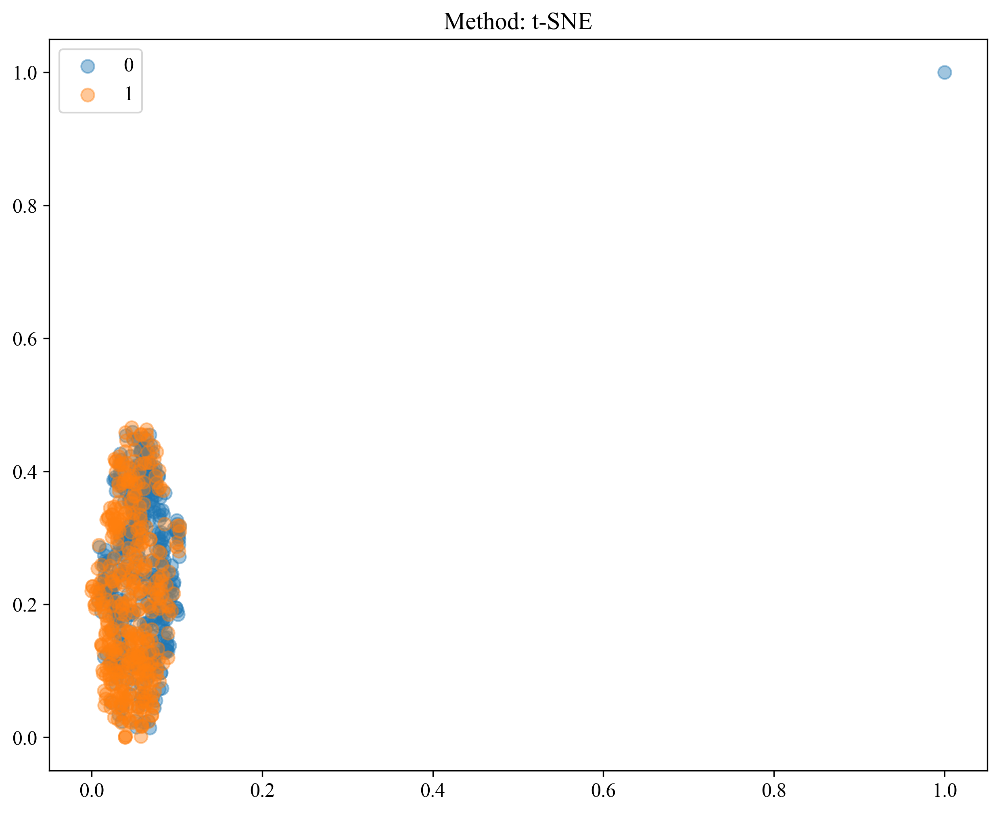

In [22]:
from onekey_algo.custom.components.comp1 import analysis_features
analysis_features(data[sel_feature[:-3]], data[labels[0]], methods='t-SNE')

## 构建数据

将样本的训练数据X与监督信息y分离出来，并且对训练数据进行划分，一般的划分原则为80%-20%

In [23]:
import numpy as np
import onekey_algo.custom.components as okcomp

n_classes = 2
train_data = sel_data[(sel_data[group_info] == 'train')]
train_ids = ids[train_data.index]
train_data = train_data.reset_index()
train_data = train_data.drop('index', axis=1)
y_data = train_data[labels]
X_data = train_data.drop(labels + [group_info], axis=1)

val_data = sel_data[sel_data[group_info] != 'train']
val_ids = ids[val_data.index]
val_data = val_data.reset_index()
val_data = val_data.drop('index', axis=1)
y_val_data = val_data[labels]
X_val_data = val_data.drop(labels + [group_info], axis=1)

test_data = sel_data[sel_data[group_info] != 'train']
test_ids = ids[test_data.index]
test_data = test_data.reset_index()
test_data = test_data.drop('index', axis=1)
y_test_data = test_data[labels]
X_test_data = test_data.drop(labels + [group_info], axis=1)

y_all_data = sel_data[labels]
X_all_data = sel_data.drop(labels + [group_info], axis=1)

column_names = X_data.columns
print(f"训练集样本数：{X_data.shape}, 验证集样本数：{X_val_data.shape}, 测试集样本数：{X_test_data.shape}")

训练集样本数：(442, 974), 验证集样本数：(318, 974), 测试集样本数：(318, 974)


### Lasso

初始化Lasso模型，alpha为惩罚系数。具体的参数文档可以参考：[文档](https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.Lasso.html?highlight=lasso#sklearn.linear_model.Lasso)

### 交叉验证

不同Lambda下的，特征的的权重大小。
```python
def lasso_cv_coefs(X_data, y_data, points=50, column_names: List[str] = None, **kwargs):
    """

    Args:
        X_data: 训练数据
        y_data: 监督数据
        points: 打印多少个点。默认50
        column_names: 列名，默认为None，当选择的数据很多的时候，建议不要添加此参数
        **kwargs: 其他用于打印控制的参数。

    """
 ```

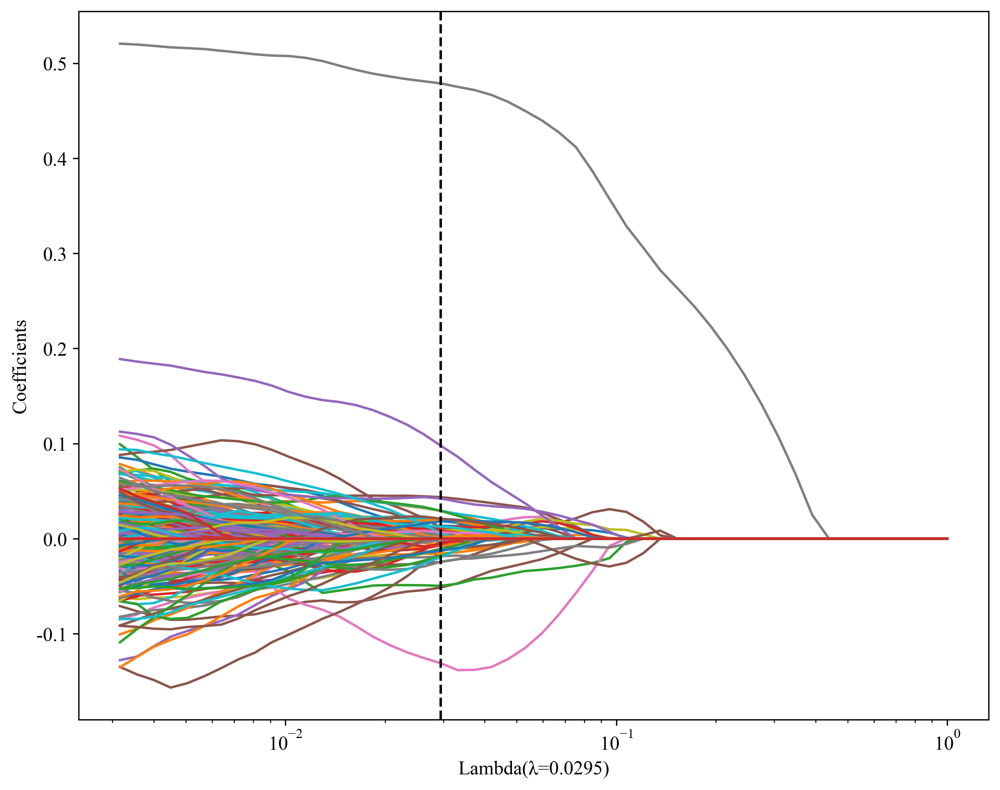

In [24]:
alpha = okcomp.comp1.lasso_cv_coefs(X_data, y_data, column_names=None, alpha_logmin=-2.5)
plt.savefig(f'img/{task_type}Rad_feature_lasso.svg', bbox_inches = 'tight')

### 模型效能

```python
def lasso_cv_efficiency(X_data, y_data, points=50, **kwargs):
    """

    Args:
        Xdata: 训练数据
        ydata: 测试数据
        points: 打印的数据密度
        **kwargs: 其他的图像样式
            # 数据点标记, fmt="o"
            # 数据点大小, ms=3
            # 数据点颜色, mfc="r"
            # 数据点边缘颜色, mec="r"
            # 误差棒颜色, ecolor="b"
            # 误差棒线宽, elinewidth=2
            # 误差棒边界线长度, capsize=2
            # 误差棒边界厚度, capthick=1
    Returns:
    """
 ```

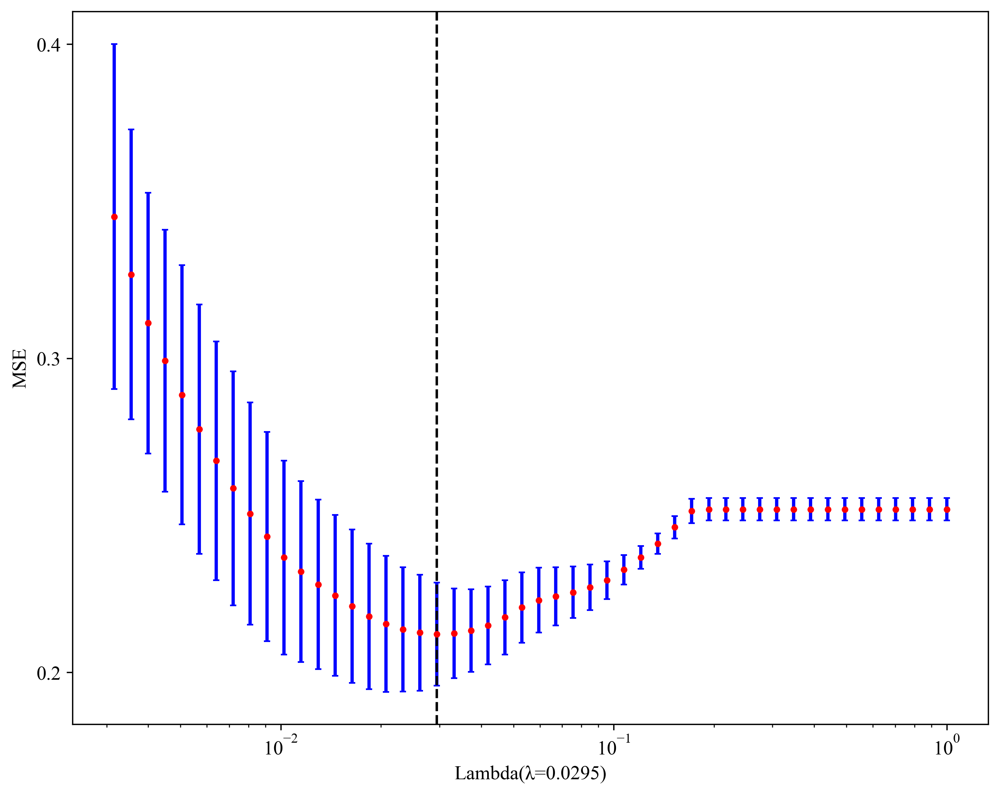

In [25]:
okcomp.comp1.lasso_cv_efficiency(X_data, y_data, points=50, alpha_logmin=-2.5)
plt.savefig(f'img/{task_type}Rad_feature_mse.svg', bbox_inches = 'tight')

### 惩罚系数

使用交叉验证的惩罚系数作为模型训练的基础。

In [26]:
from sklearn import linear_model

model = linear_model.Lasso(alpha=alpha)
model.fit(X_data, y_data[labels])

Lasso(alpha=0.029470517025518114)

### 特征筛选

筛选出其中coef > 0的特征。并且打印出相应的公式。

label = 0.5  -0.001296 * gradient_glcm_Imc2_h1 +0.021784 * logarithm_ngtdm_Contrast_h1 +0.031185 * original_shape_Maximum2DDiameterColumn_h1 -0.013276 * square_glcm_ClusterShade_h1 +0.005646 * square_glcm_Idn_h1 -0.023077 * wavelet_HHH_firstorder_Minimum_h1 -0.002910 * wavelet_HHL_glcm_Imc2_h1 +0.016356 * wavelet_LHH_glrlm_GrayLevelVariance_h1 -0.006771 * wavelet_LHH_glszm_SmallAreaHighGrayLevelEmphasis_h1 +0.003986 * wavelet_LHL_firstorder_Maximum_h1 -0.000167 * exponential_glcm_ClusterShade_h2 -0.005894 * gradient_glcm_Imc2_h2 -0.013588 * lbp_3D_k_ngtdm_Contrast_h2 +0.004969 * lbp_3D_m1_glszm_LargeAreaLowGrayLevelEmphasis_h2 +0.040777 * lbp_3D_m2_glszm_SmallAreaEmphasis_h2 +0.002534 * squareroot_glcm_ClusterShade_h2 -0.011165 * wavelet_HHH_glcm_Imc1_h2 +0.008967 * wavelet_HLH_firstorder_Kurtosis_h2 +0.041018 * wavelet_LLH_firstorder_Skewness_h2 +0.007208 * exponential_glcm_Correlation_h3 -0.030556 * lbp_3D_k_firstorder_10Percentile_h3 -0.012887 * lbp_3D_k_gldm_DependenceNonUniformity

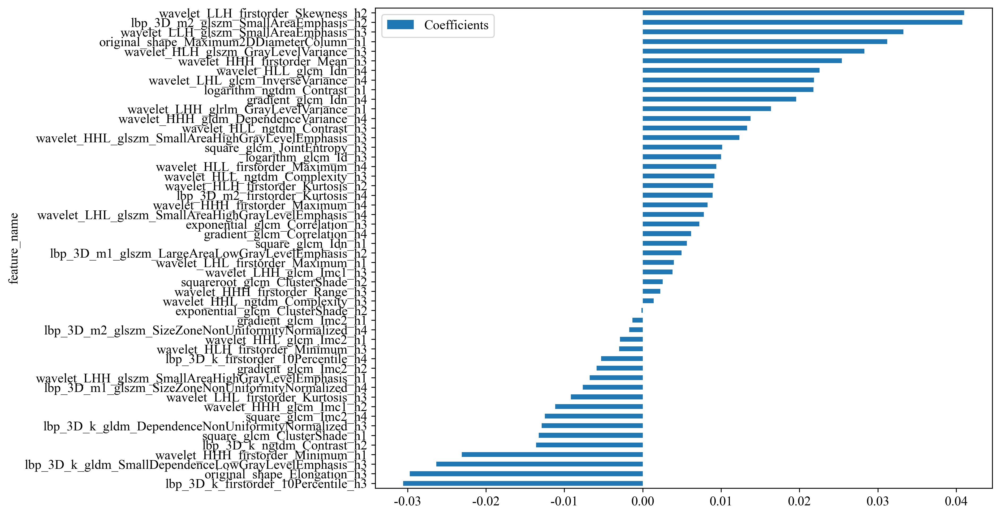

In [27]:
COEF_THRESHOLD = 0 # 筛选的特征阈值
scores = []
selected_features = []
for idx, label in enumerate(labels):
    feat_coef = [(feat_name, coef) for feat_name, coef in zip(column_names, model.coef_) 
                 if COEF_THRESHOLD is None or abs(coef) > COEF_THRESHOLD]
    selected_features.append([feat for feat, _ in feat_coef])
    formula = ' '.join([f"{coef:+.6f} * {feat_name}" for feat_name, coef in feat_coef])
    score = f"{label} = {model.intercept_[idx]} {'+' if formula[0] != '-' else ''} {formula}"
    scores.append(score)
    
    feat_coef = sorted(feat_coef, key=lambda x: x[1])
    feat_coef_df = pd.DataFrame(feat_coef, columns=['feature_name', 'Coefficients'])
    feat_coef_df.plot(x='feature_name', y='Coefficients', kind='barh')
    plt.savefig(f'img/{label}_{task_type}Rad_feature_weights.svg', bbox_inches = 'tight')
    
print('\n'.join(scores))

### 进一步筛选特征

使用Lasso筛选出来的Coefficients比较高的特征作为训练数据。

In [43]:
X_data = X_data[selected_features[0]]
X_val_data = X_val_data[selected_features[0]]
X_test_data = X_test_data[selected_features[0]]
X_data.columns

Index(['gradient_glcm_Imc2_h1', 'logarithm_ngtdm_Contrast_h1',
       'original_shape_Maximum2DDiameterColumn_h1',
       'square_glcm_ClusterShade_h1', 'square_glcm_Idn_h1',
       'wavelet_HHH_firstorder_Minimum_h1', 'wavelet_HHL_glcm_Imc2_h1',
       'wavelet_LHH_glrlm_GrayLevelVariance_h1',
       'wavelet_LHH_glszm_SmallAreaHighGrayLevelEmphasis_h1',
       'wavelet_LHL_firstorder_Maximum_h1', 'exponential_glcm_ClusterShade_h2',
       'gradient_glcm_Imc2_h2', 'lbp_3D_k_ngtdm_Contrast_h2',
       'lbp_3D_m1_glszm_LargeAreaLowGrayLevelEmphasis_h2',
       'lbp_3D_m2_glszm_SmallAreaEmphasis_h2',
       'squareroot_glcm_ClusterShade_h2', 'wavelet_HHH_glcm_Imc1_h2',
       'wavelet_HLH_firstorder_Kurtosis_h2',
       'wavelet_LLH_firstorder_Skewness_h2', 'exponential_glcm_Correlation_h3',
       'lbp_3D_k_firstorder_10Percentile_h3',
       'lbp_3D_k_gldm_DependenceNonUniformityNormalized_h3',
       'lbp_3D_k_gldm_SmallDependenceLowGrayLevelEmphasis_h3',
       'logarithm_glcm_Id_h3'

In [44]:
X_test_data.to_csv('final_featuress.csv', index=False)

## 模型筛选

根据筛选出来的数据，做模型的初步选择。当前主要使用到的是Onekey中的

1. SVM，支持向量机，引用参考。
2. KNN，K紧邻，引用参考。
3. Decision Tree，决策树，引用参考。
4. Random Forests, 随机森林，引用参考。
5. XGBoost, bosting方法。引用参考。
6. LightGBM, bosting方法，引用参考。

In [30]:
import joblib
from onekey_algo.custom.components.comp1 import plot_feature_importance
from sklearn.ensemble import ExtraTreesClassifier, RandomForestClassifier
from sklearn.neural_network import MLPClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from sklearn.linear_model import LogisticRegression

model_names = get_param_in_cwd('ml_models')
models = okcomp.comp1.create_clf_model(model_names)
# models['LR'] = LogisticRegression(penalty='l2', max_iter=100)
models['RandomForest'] = RandomForestClassifier(n_estimators=50, max_depth=3,
                                                min_samples_split=4, random_state=0)
models['XGBoost'] = XGBClassifier(n_estimators=10, objective='binary:logistic', max_depth=10, min_child_weight=.5,
                                  use_label_encoder=False, eval_metric='error')
models['LightGBM'] = LGBMClassifier(n_estimators=20,  max_depth=4, min_child_weight=0.5,)
models['ExtraTrees'] = ExtraTreesClassifier(n_estimators=80, max_depth=3, min_samples_split=2, random_state=0)
    
model_names = list(models.keys())

### 交叉验证

`n_trails`指定随机次数，每次采用的是80%训练，随机20%进行测试，找到最好的模型，以及对应的最好的数据划分。


```python
def get_bst_split(X_data: pd.DataFrame, y_data: pd.DataFrame,
            models: dict, test_size=0.2, metric_fn=accuracy_score, n_trails=10,
            cv: bool = False, shuffle: bool = False, metric_cut_off: float = None, random_state=None):
    """
    寻找数据集中最好的数据划分。
    Args:
        X_data: 训练数据
        y_data: 监督数据
        models: 模型名称，Dict类型、
        test_size: 测试集比例，只有当cv=False时生效
        metric_fn: 评价模型好坏的函数，默认准确率，可选roc_auc_score。
        n_trails: 尝试多少次寻找最佳数据集划分。
        cv: 是否是交叉验证，默认是False，当为True时，n_trails为交叉验证的n_fold
        shuffle: 是否进行随机打乱
        metric_cut_off: 当metric_fn的值达到多少时进行截断。
        random_state: 随机种子

    Returns: {'max_idx': max_idx, "max_model": max_model, "max_metric": max_metric, "results": results}

    """
```

**注意：这里采用了【挑数据】，如果想要严谨，请修改`n_trails=1`。**

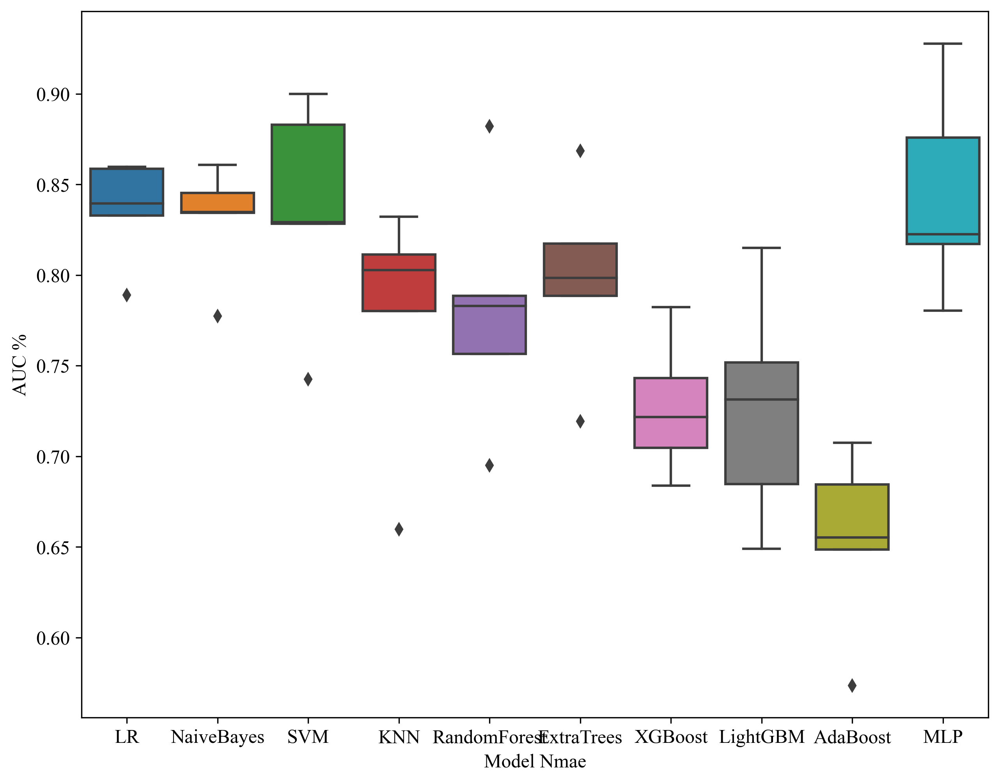

In [31]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.metrics import accuracy_score, roc_auc_score

for l in labels:
    results = okcomp.comp1.get_bst_split(X_data, y_data[[l]], models, test_size=0.2, metric_fn=roc_auc_score, n_trails=5, cv=False, 
                                         random_state=130)
    _, (X_train_sel, X_test_sel, y_train_sel, y_test_sel) = results['results'][results['max_idx']]
    X_train_sel, X_val_sel, X_test_sel, y_train_sel, y_val_sel, y_test_sel = X_data, X_val_data, X_test_data, y_data, y_val_data, y_test_data
    train_ids_sel, test_ids_sel = train_ids, test_ids
    trails, _ = zip(*results['results'])
    cv_results = pd.DataFrame(trails, columns=model_names)
    # 可视化每个模型在不同的数据划分中的效果。
    sns.boxplot(data=cv_results)
    plt.ylabel('AUC %')
    plt.xlabel('Model Nmae')
    # plt.xticks(rotation=90)
    # plt.ylim(0.5,)
    plt.savefig(f'img/{l}_{task_type}Rad_model_cv.svg', bbox_inches = 'tight')
    plt.show()

## 模型筛选

使用最好的数据划分，进行后续的模型研究。

**注意**: 一般情况下论文使用的是随机划分的数据，但也有些论文使用【刻意】筛选的数据划分。

In [32]:
import joblib
import json
from onekey_algo.custom.components.comp1 import plot_feature_importance, plot_learning_curve, smote_resample

from sklearn.ensemble import ExtraTreesClassifier, RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier
from sklearn.neural_network import MLPClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier
from onekey_algo.custom.encrypt.security import dump_onekey, load_onekey

targets = []
os.makedirs('models', exist_ok=True)
for l in labels:
    new_models = okcomp.comp1.create_clf_model_none_overfit(model_names)
    new_models['LR'] = LogisticRegression(penalty='none', max_iter=100)
    new_models['SVM'] = SVC(probability=True, max_iter=100, kernel='linear')
    new_models['RandomForest'] = RandomForestClassifier(n_estimators=5, max_depth=3,
                                                        min_samples_split=4, random_state=0)
    new_models['XGBoost'] = XGBClassifier(n_estimators=6, objective='binary:logistic', max_depth=3, min_child_weight=.2,
                                              use_label_encoder=False, eval_metric='error')
    new_models['LightGBM'] = LGBMClassifier(n_estimators=2,  max_depth=1, min_child_weight=0.5,)
    new_models['ExtraTrees'] = ExtraTreesClassifier(n_estimators=11, max_depth=5, min_samples_split=6, random_state=0)
    new_models['GradientBoosting'] = GradientBoostingClassifier(n_estimators=50, random_state=0)
    new_models['AdaBoost'] = AdaBoostClassifier(n_estimators=10, random_state=0)
    new_models['MLP'] = MLPClassifier(hidden_layer_sizes=(61, 128, 64, 32), max_iter=300, solver='sgd', random_state=0)
    model_names = list(new_models.keys())
    new_models = list(new_models.values())
    
    for mn, m in zip(model_names, new_models):
        X_train_smote, y_train_smote = X_train_sel, y_train_sel
        # 取消下一行的注释可以使用Smote进行采样，解决样本不均衡的问题。
        if get_param_in_cwd('use_smote', False):
            X_train_smote, y_train_smote = smote_resample(X_train_sel, y_train_sel)
        m.fit(X_train_smote, y_train_smote[l])
        # 输出模型特征重要性，只针对高级树模型有用
#         plot_feature_importance(m, selected_features[0], save_dir='img')
#         plot_learning_curve(m, X_train_sel, y_train_sel, title=f'Learning Curve {mn}')
#         plt.savefig(f"img/Rad_{mn}_learning_curve.svg", bbox_inches='tight')
        plt.show()
    targets.append(new_models)
    encoder = json.loads(open('results/norm_info.json').read())
    dump_onekey({'TYPE':'WEBUI',
                 'data': pd.concat([ids, combined_data[selected_features[0]]], axis=1),
                 'models': {mn:nm for mn, nm in zip(model_names, new_models)},
                 'encoder': {fname: encoder[fname] for fname in selected_features[0]},
                 'feature_config': selected_features[0]},
                save_path=f'web/config')

In [33]:
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import OneHotEncoder
from onekey_algo.custom.components.delong import calc_95_CI
from onekey_algo.custom.components.metrics import analysis_pred_binary

metric = []
pred_sel_idx = []
predictions = [[(model.predict(X_train_sel), model.predict(X_test_sel))  
                for model in target] for label, target in zip(labels, targets)]
pred_scores = [[(model.predict_proba(X_train_sel), model.predict_proba(X_test_sel)) 
                for model in target] for label, target in zip(labels, targets)]
for label, prediction, scores in zip(labels, predictions, pred_scores):
    pred_sel_idx_label = []
    for mname, (train_pred, test_pred), (train_score, test_score) in zip(model_names, prediction, scores):
        # 计算训练集指数
        acc, auc, ci, tpr, tnr, ppv, npv, precision, recall, f1, thres = analysis_pred_binary(y_train_sel[label], 
                                                                                              train_score[:, 1])
        ci = f"{ci[0]:.4f} - {ci[1]:.4f}"
        metric.append((mname, acc, auc, ci, tpr, tnr, ppv, npv, precision, recall, f1, thres, f"Train-{label}"))

        # 计算验证集指标
        acc, auc, ci, tpr, tnr, ppv, npv, precision, recall, f1, thres = analysis_pred_binary(y_test_sel[label], 
                                                                                              test_score[:, 1])
        ci = f"{ci[0]:.4f} - {ci[1]:.4f}"
        metric.append((mname, acc, auc, ci, tpr, tnr, ppv, npv, precision, recall, f1, thres, f'Test-{label}'))
        # 计算thres对应的sel idx
        pred_sel_idx_label.append(np.logical_or(test_score[:, 0] >= thres, test_score[:, 1] >= thres))

    pred_sel_idx.append(pred_sel_idx_label)
metric = pd.DataFrame(metric, index=None, columns=['model_name', 'Accuracy', 'AUC', '95% CI',
                                                   'Sensitivity', 'Specificity', 
                                                   'PPV', 'NPV', 'Precision', 'Recall', 'F1',
                                                   'Threshold', 'Task'])
metric

,model_name,Accuracy,AUC,95% CI,Sensitivity,Specificity,PPV,NPV,Precision,Recall,F1,Threshold,Task
0,LR,0.824,0.908,0.8814 - 0.9336,0.833,0.814,0.818,0.829,0.818,0.833,0.825,0.494,Train-label
1,LR,0.670,0.720,0.6639 - 0.7758,0.806,0.523,0.646,0.714,0.646,0.806,0.717,0.362,Test-label
2,NaiveBayes,0.767,0.846,0.8103 - 0.8810,0.837,0.697,0.734,0.811,0.734,0.837,0.782,0.004,Train-label
3,NaiveBayes,0.701,0.730,0.6749 - 0.7861,0.721,0.680,0.708,0.693,0.708,0.721,0.715,0.073,Test-label
4,SVM,0.624,0.677,0.6280 - 0.7267,0.516,0.733,0.659,0.602,0.659,0.516,0.579,0.548,Train-label
5,SVM,0.616,0.650,0.5900 - 0.7096,0.606,0.627,0.637,0.596,0.637,0.606,0.621,0.548,Test-label
6,KNN,0.828,0.897,0.8695 - 0.9244,0.801,0.855,0.847,0.811,0.847,0.801,0.823,0.600,Train-label
7,KNN,0.619,0.652,0.5932 - 0.7110,0.794,0.431,0.601,0.660,0.601,0.794,0.684,0.400,Test-label
8,RandomForest,0.762,0.819,0.7805 - 0.8579,0.751,0.774,0.769,0.757,0.769,0.751,0.760,0.495,Train-label
9,RandomForest,0.730,0.778,0.7276 - 0.8283,0.794,0.660,0.716,0.748,0.716,0.794,0.753,0.486,Test-label


### 绘制曲线

绘制的不同模型的准确率柱状图和折线图曲线。

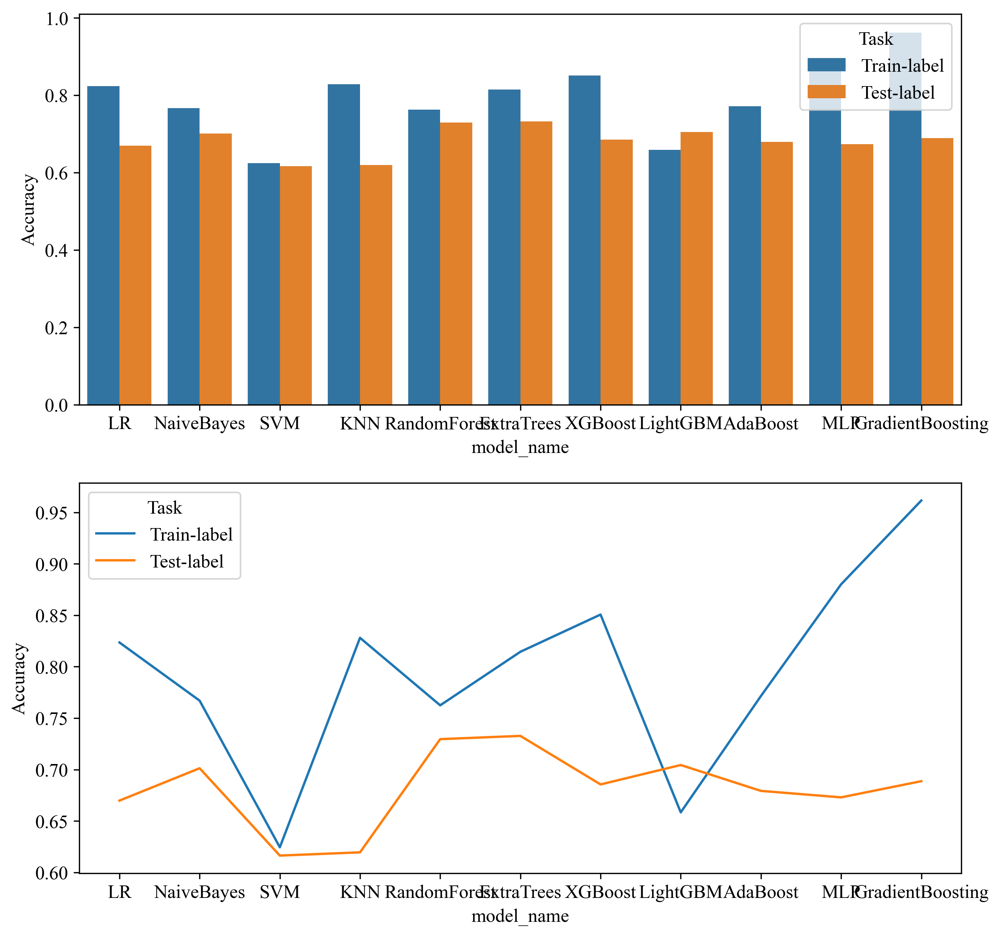

In [34]:
import seaborn as sns

plt.figure(figsize=(10, 10))
plt.subplot(211)
sns.barplot(x='model_name', y='Accuracy', data=metric, hue='Task')
plt.subplot(212)
sns.lineplot(x='model_name', y='Accuracy', data=metric, hue='Task')
plt.savefig(f'img/{task_type}Rad_model_acc.svg', bbox_inches = 'tight')

### 绘制ROC曲线
确定最好的模型，并且绘制曲线。

```python
def draw_roc(y_test, y_score, title='ROC', labels=None):
```

`sel_model = ['SVM', 'KNN']`参数为想要绘制的模型对应的参数。

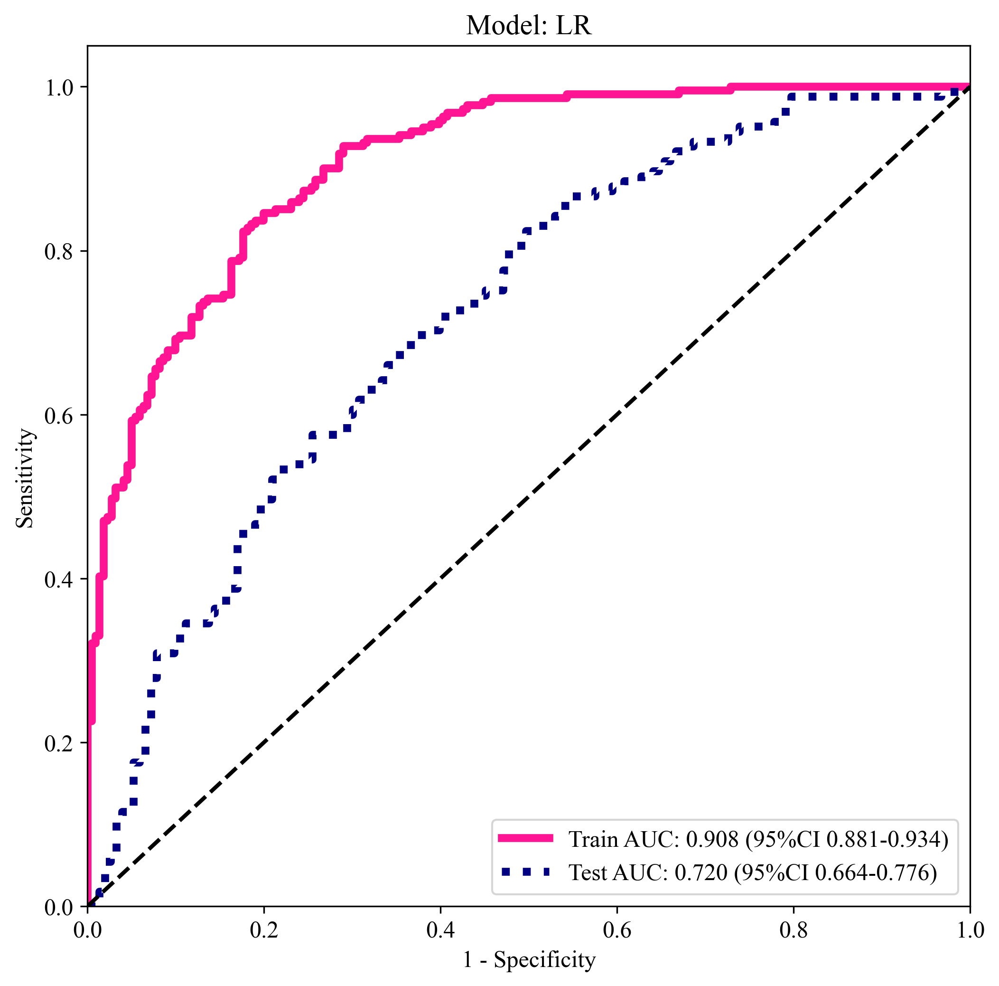

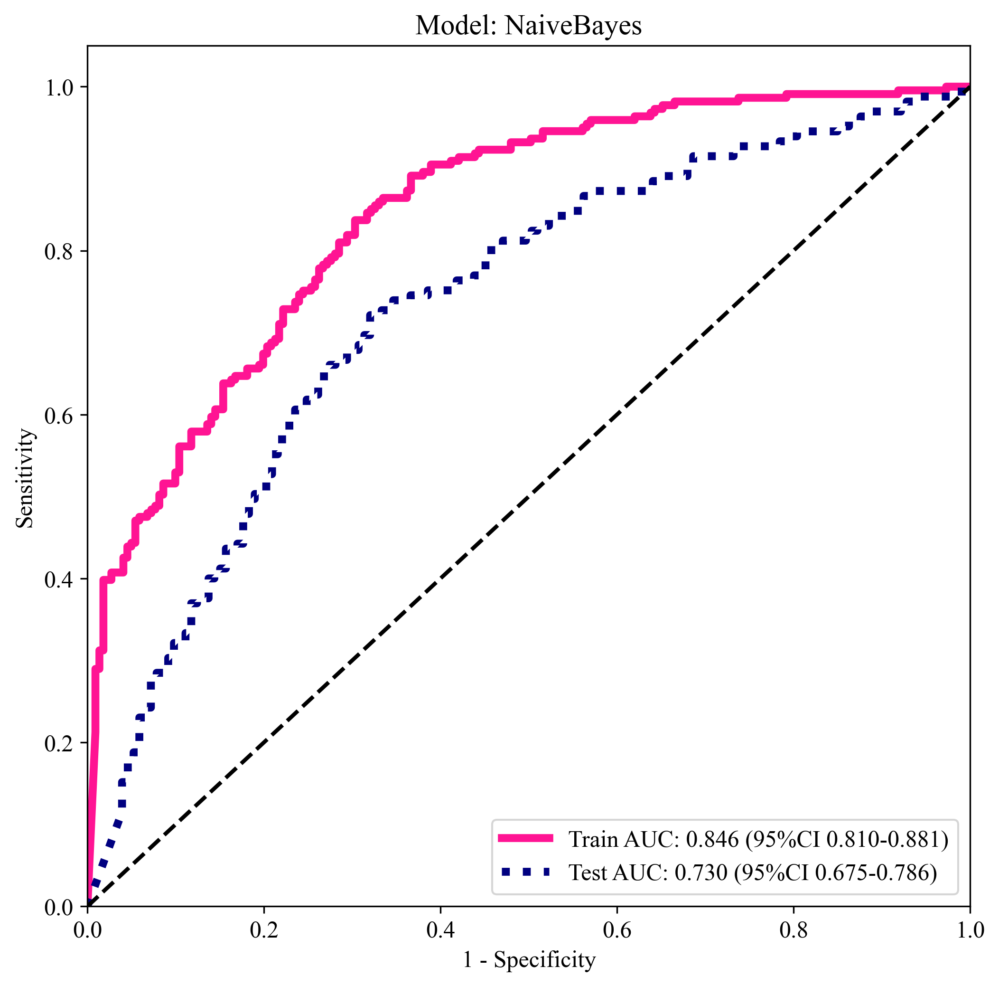

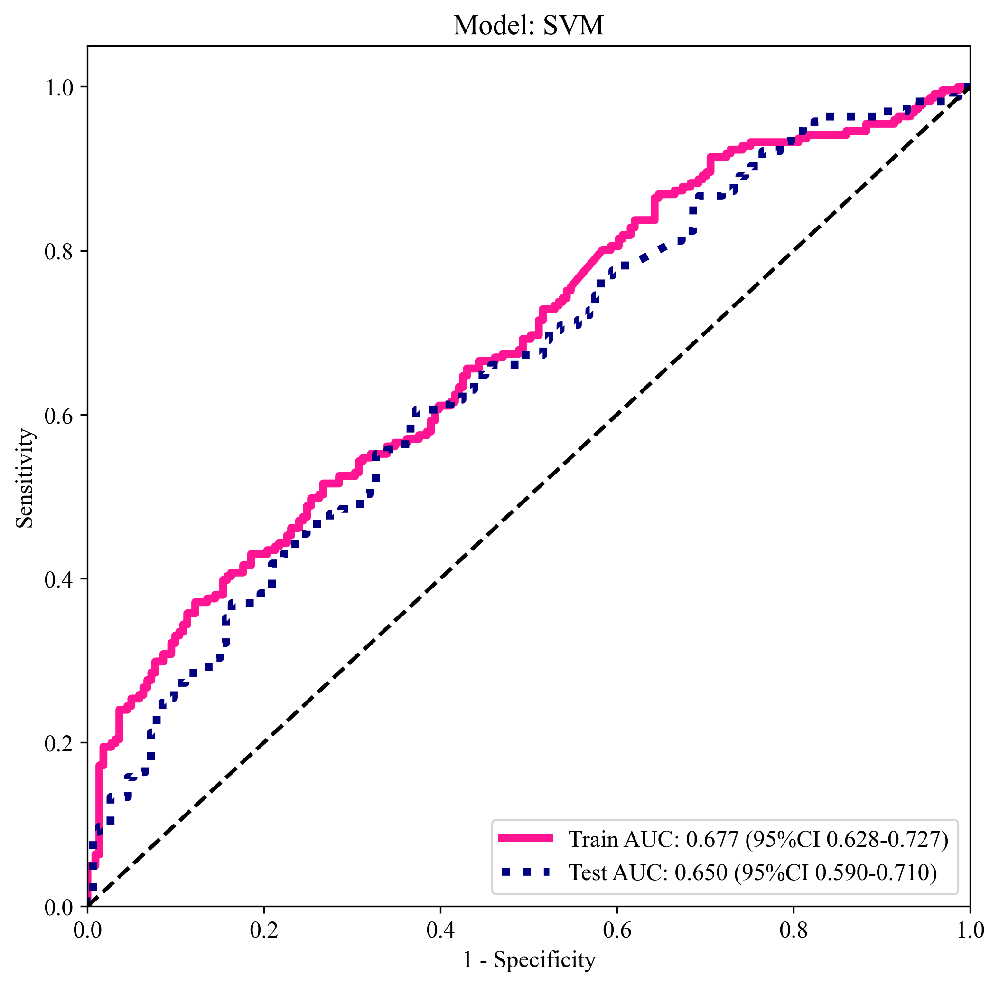

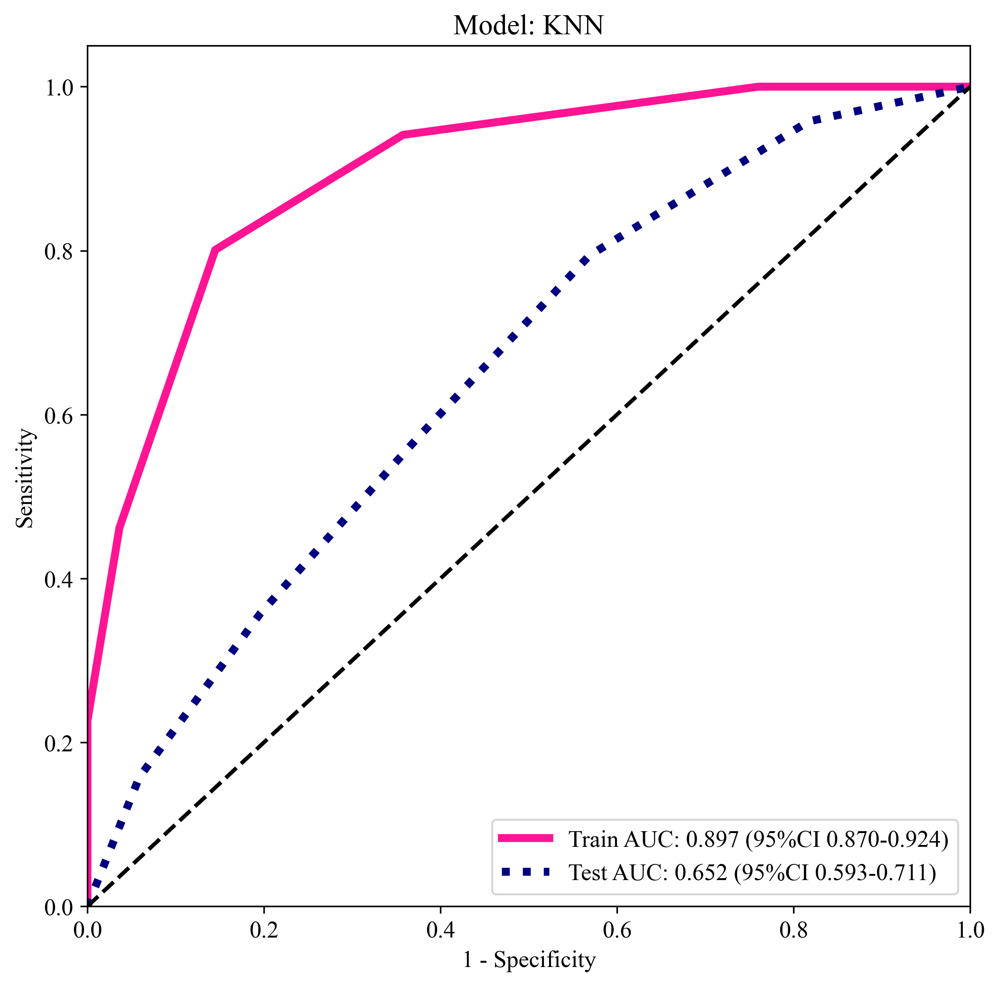

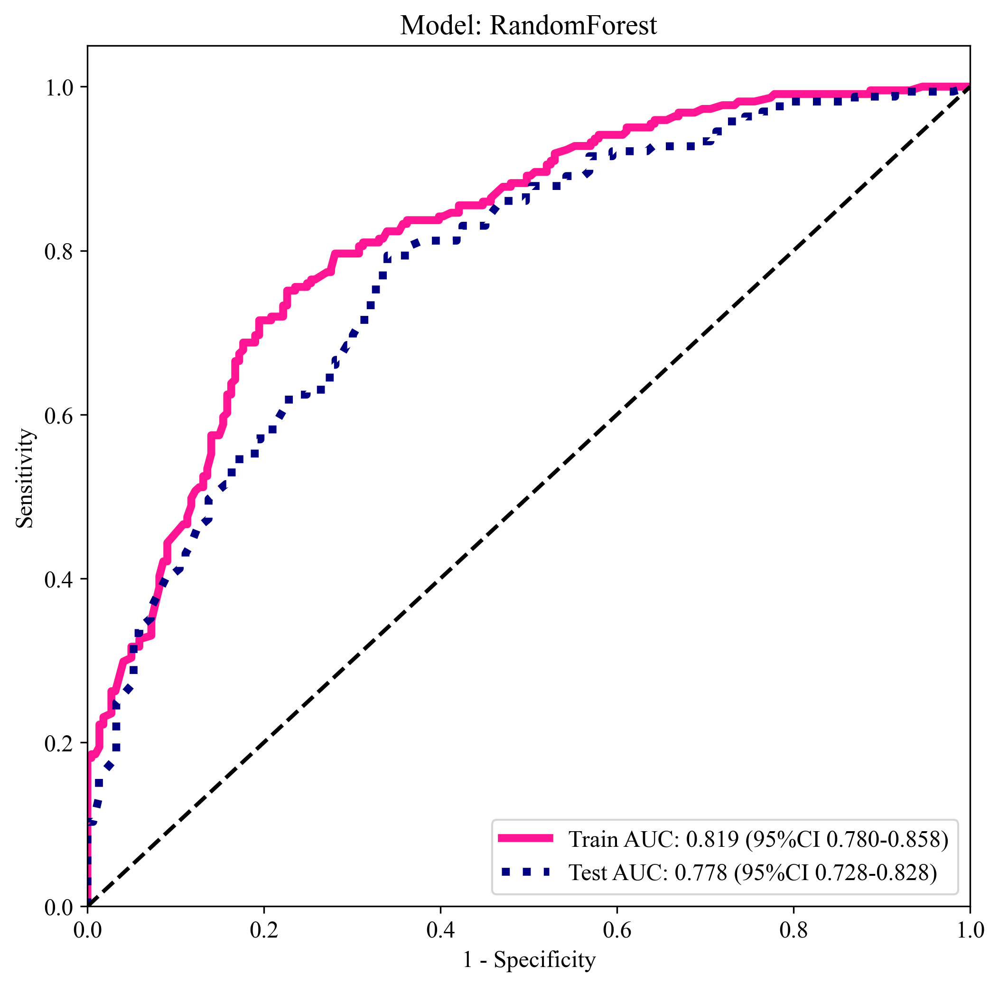

...

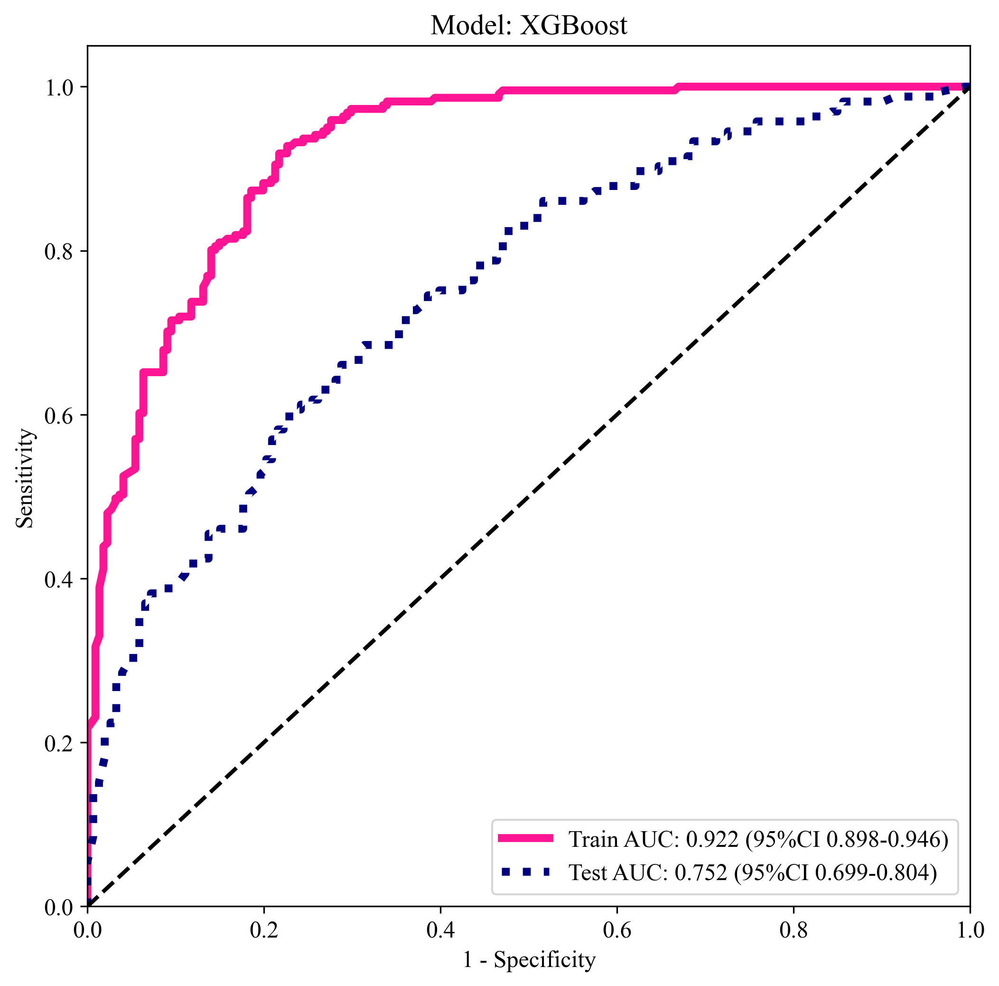

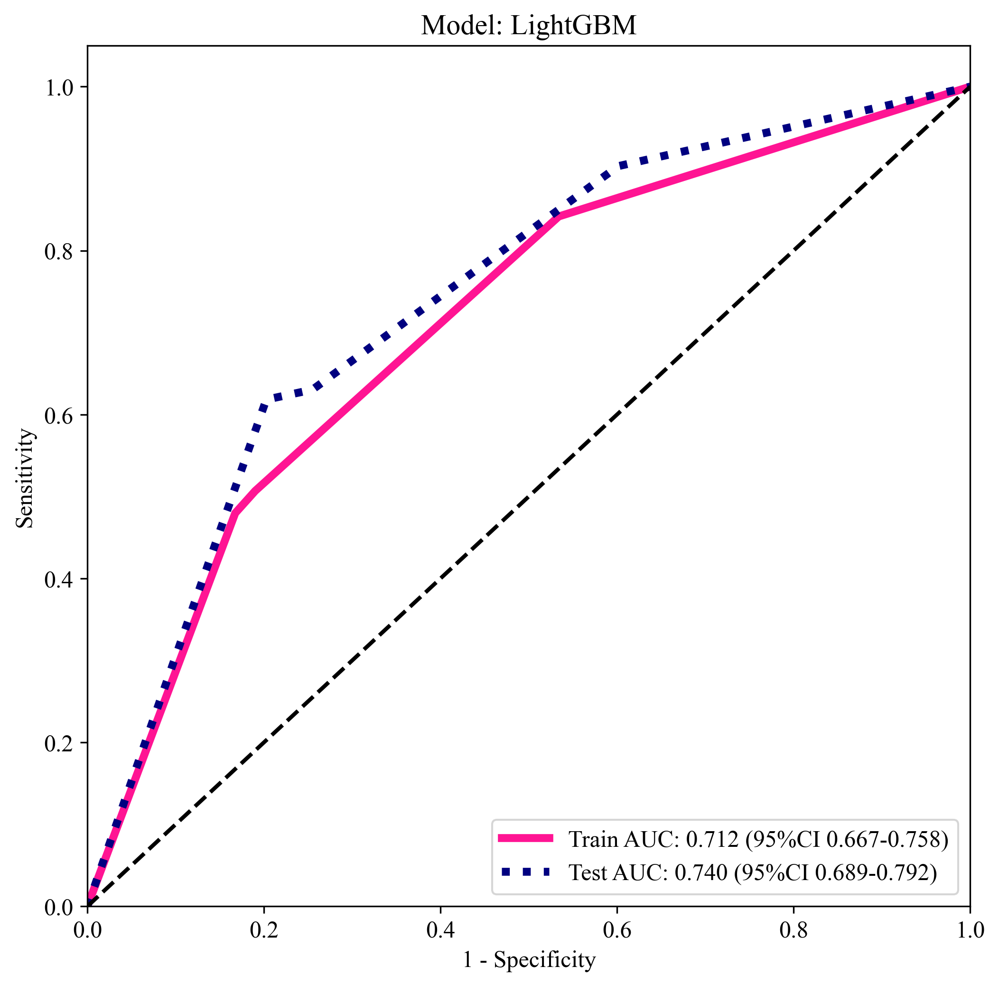

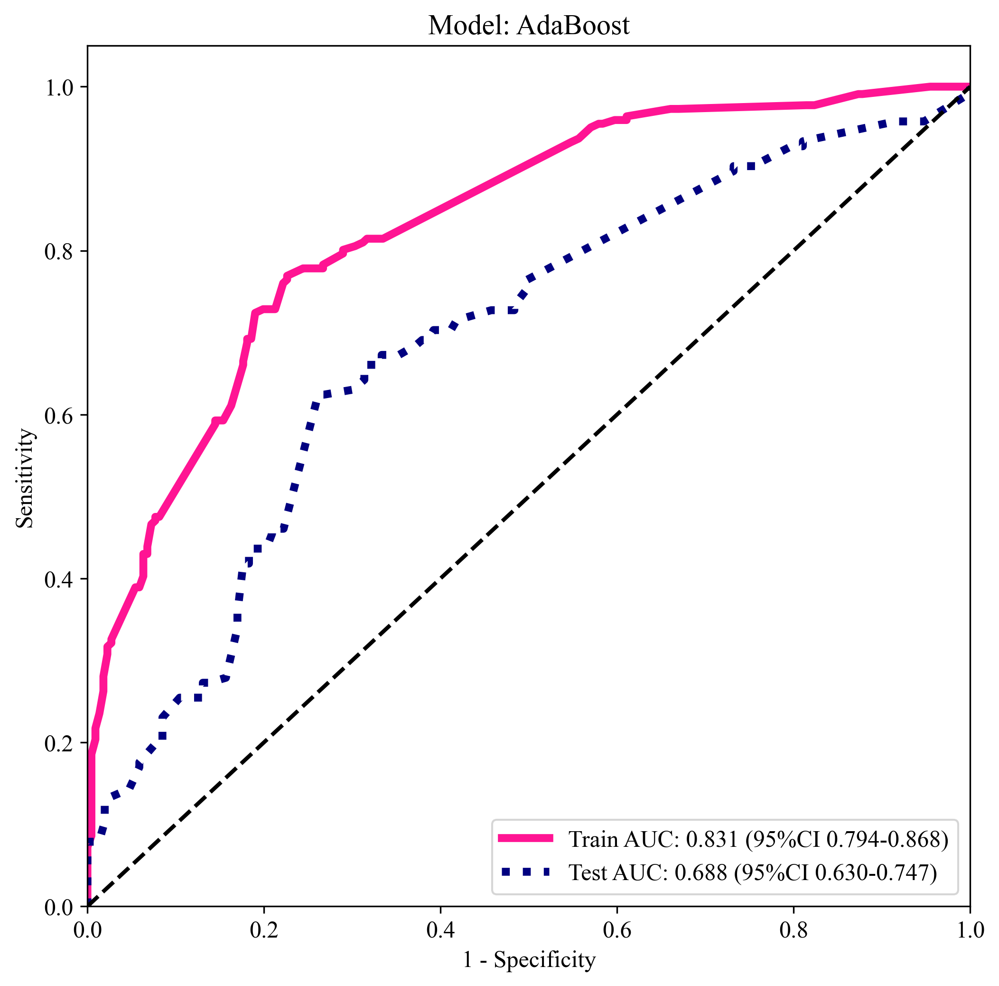

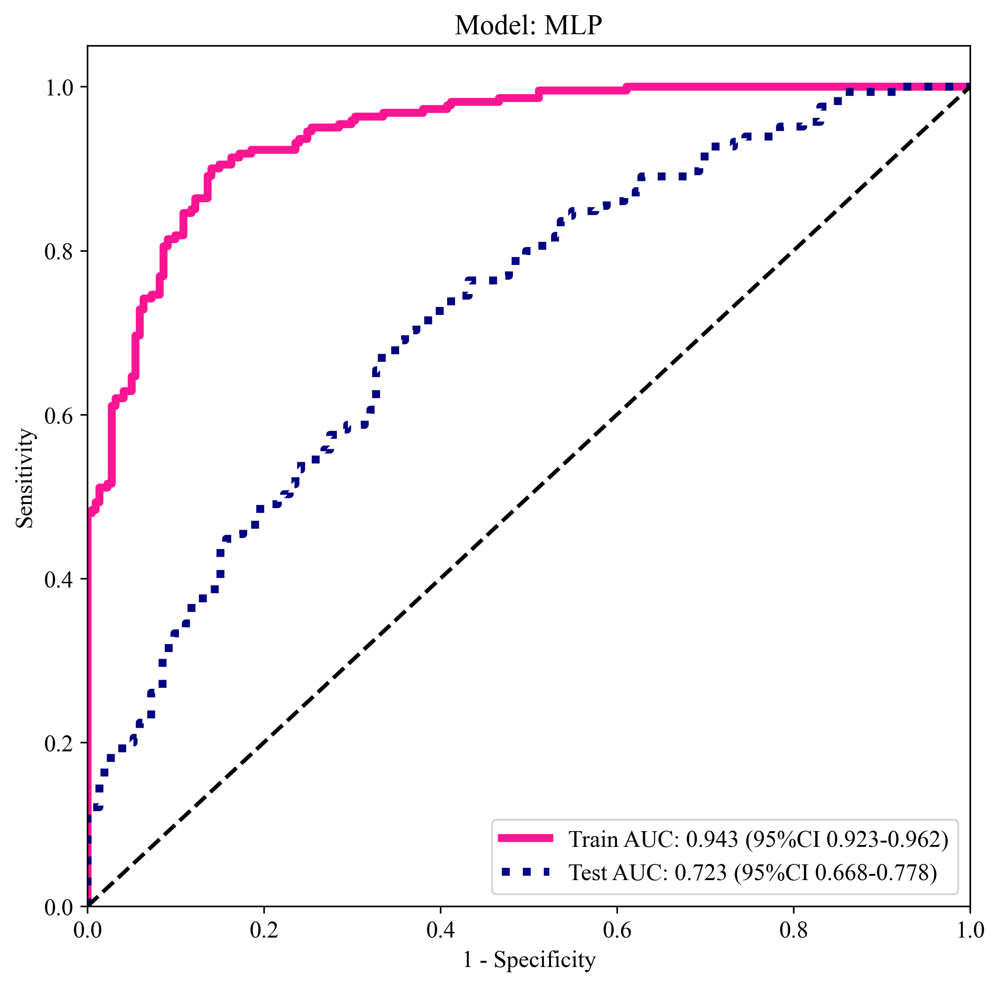

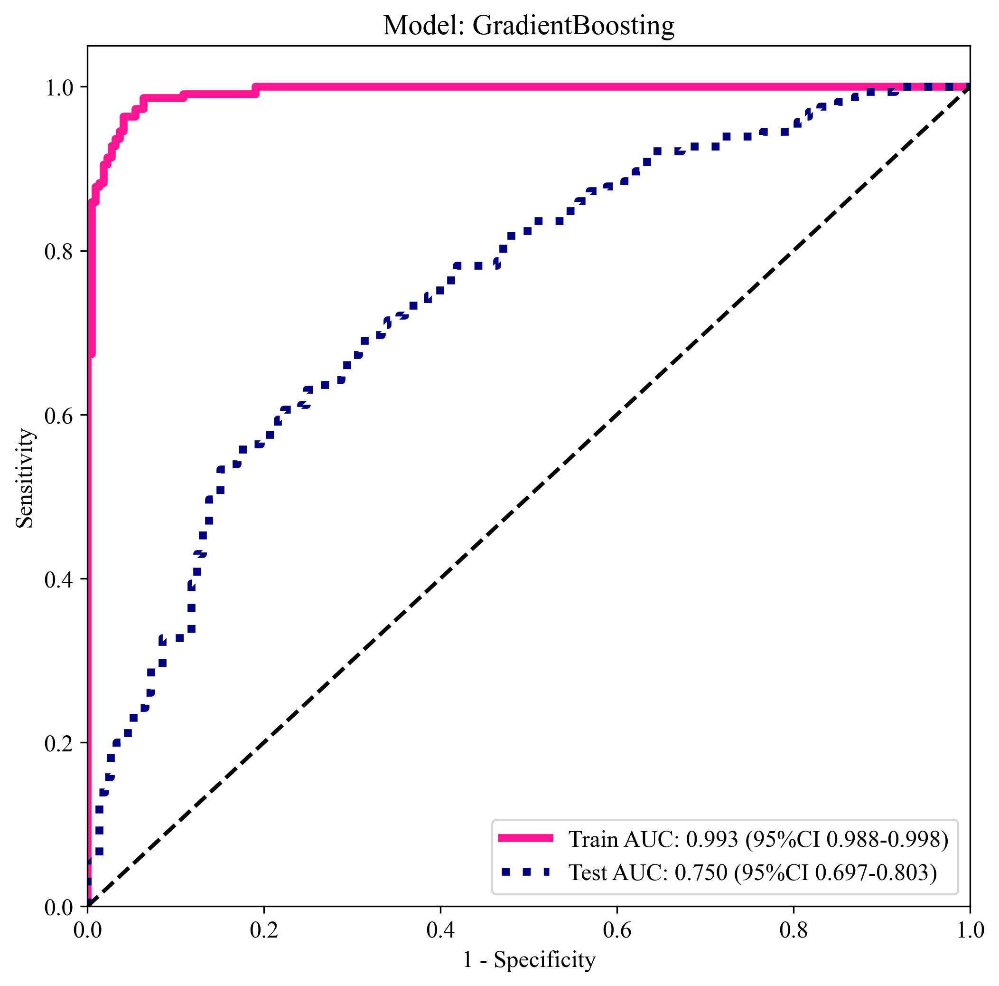

In [35]:
sel_model = model_names

for sm in sel_model:
    if sm in model_names:
        sel_model_idx = model_names.index(sm)
    
        # Plot all ROC curves
        plt.figure(figsize=(8, 8))
        for pred_score, label in zip(pred_scores, labels):
            okcomp.comp1.draw_roc([np.array(y_train_sel[label]), np.array(y_test_sel[label])], 
                                  pred_score[sel_model_idx], 
                                  labels=['Train', 'Test'], title=f"Model: {sm}")
            plt.savefig(f'img/{label}_{task_type}Rad_model_{sm}_roc.svg', bbox_inches = 'tight')
            plt.show()

#### 汇总所有模型

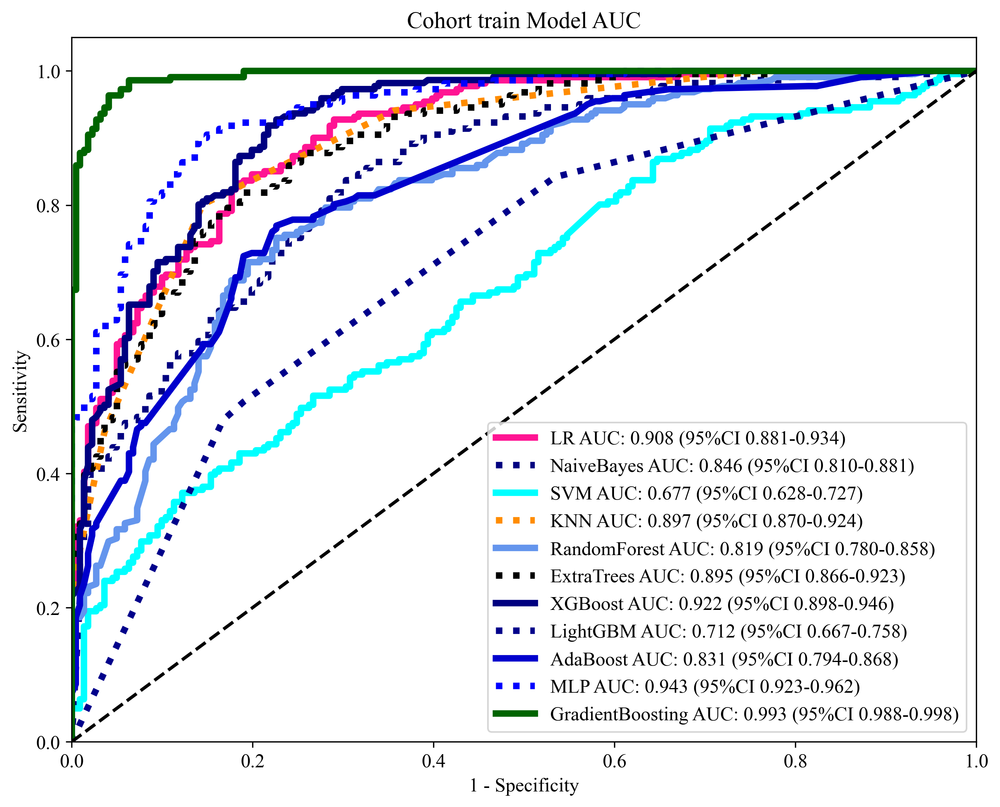

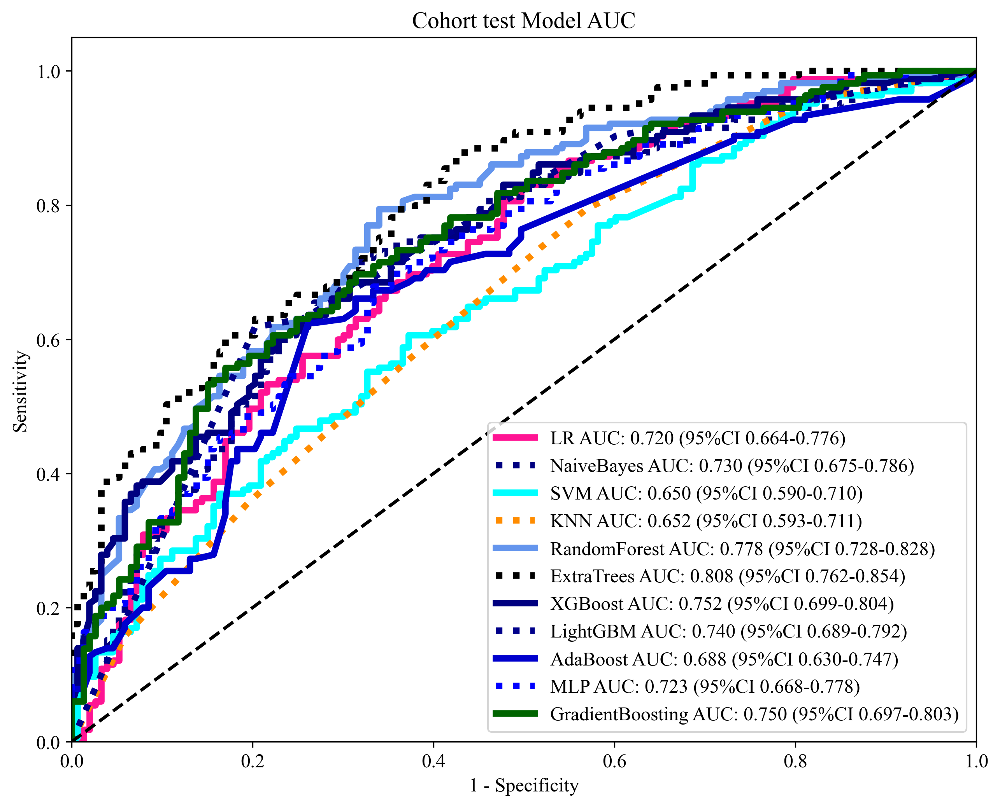

In [36]:
sel_model = model_names

for pred_score, label in zip(pred_scores, labels):
    pred_val_scores = []
    pred_test_scores = []
    
    for sm in sel_model:
        if sm in model_names:
            sel_model_idx = model_names.index(sm)
            pred_val_scores.append(pred_score[sel_model_idx][0])
            pred_test_scores.append(pred_score[sel_model_idx][1])
    okcomp.comp1.draw_roc([np.array(y_train_sel[label])] * len(pred_val_scores), 
                          pred_val_scores, 
                          labels=sel_model, title=f"Cohort train Model AUC")
    plt.savefig(f'img/{label}_{task_type}Rad_model_train_roc.svg', bbox_inches = 'tight')
    plt.show()
    okcomp.comp1.draw_roc([np.array(y_test_sel[label])] * len(pred_test_scores), 
                          pred_test_scores, 
                          labels=sel_model, title=f"Cohort test Model AUC")
    plt.savefig(f'img/{label}_{task_type}Rad_model_test_roc.svg', bbox_inches = 'tight')
    plt.show()

### DCA 决策曲线

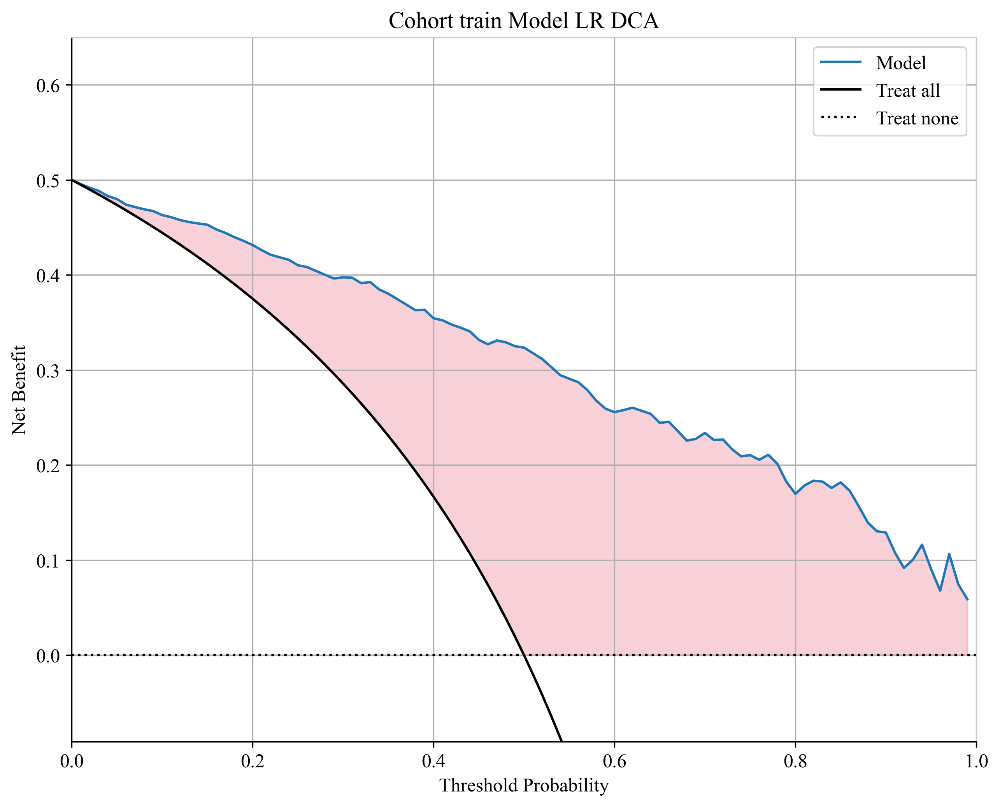

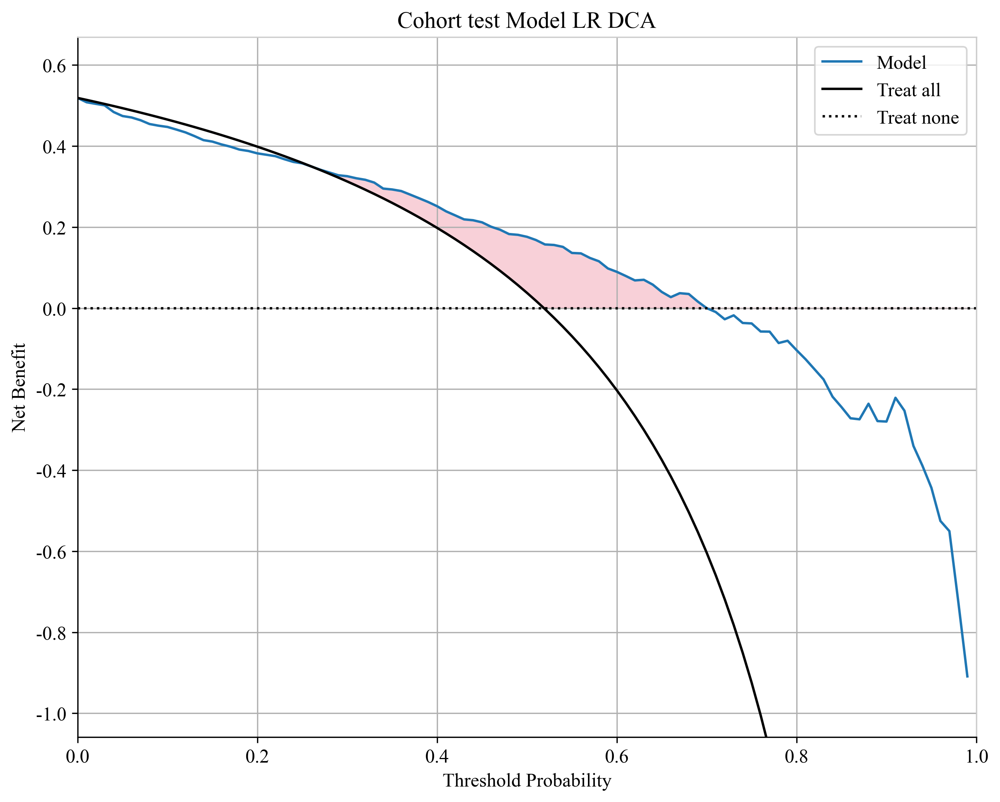

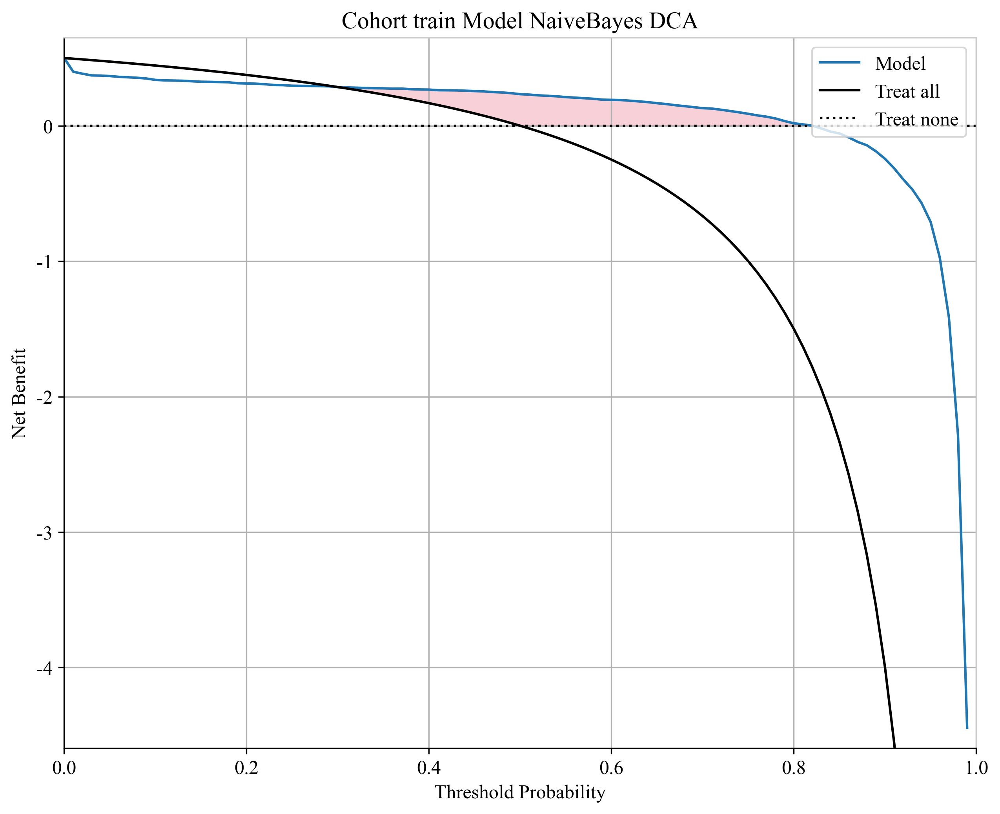

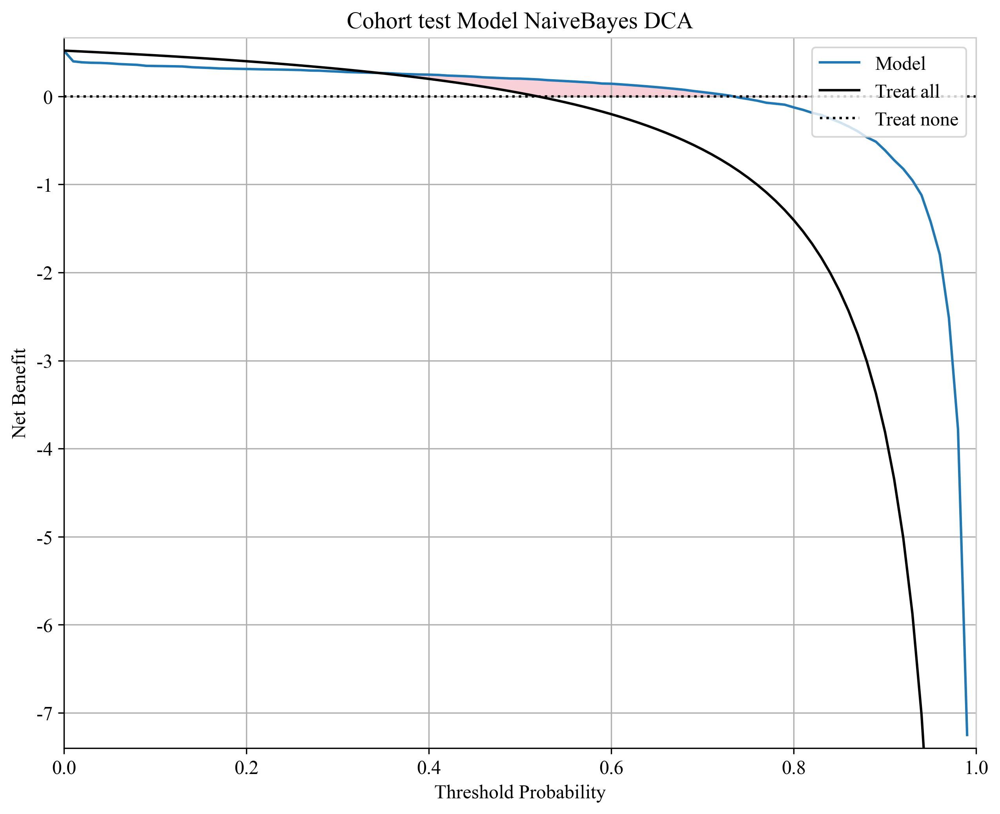

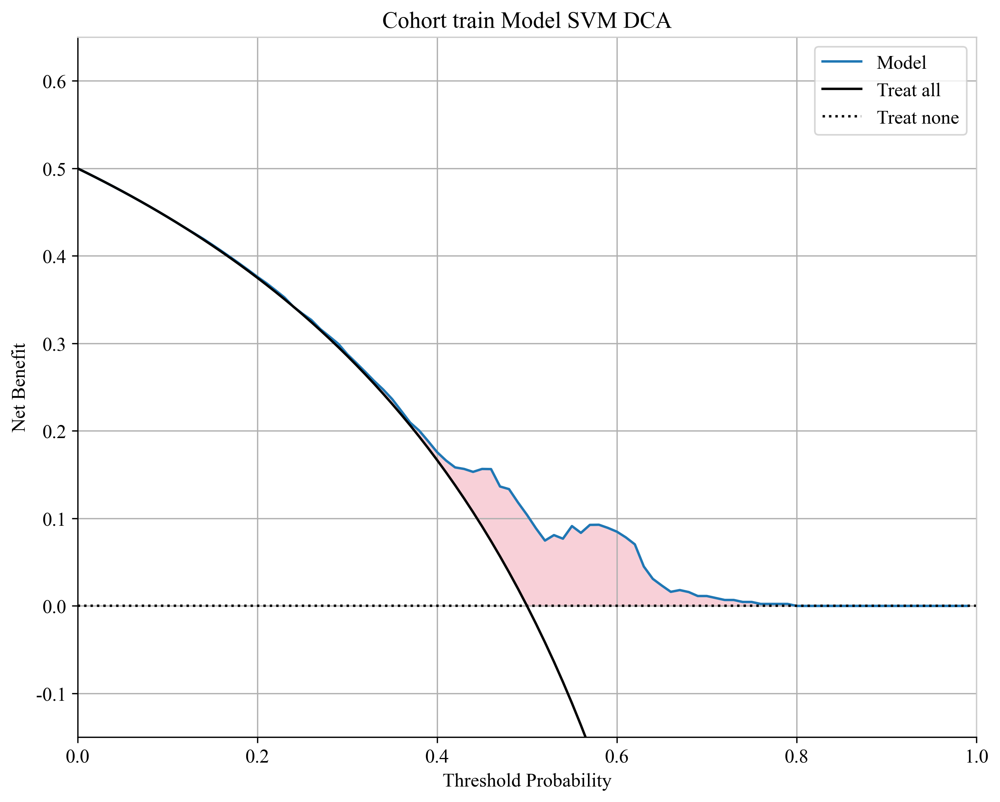

...

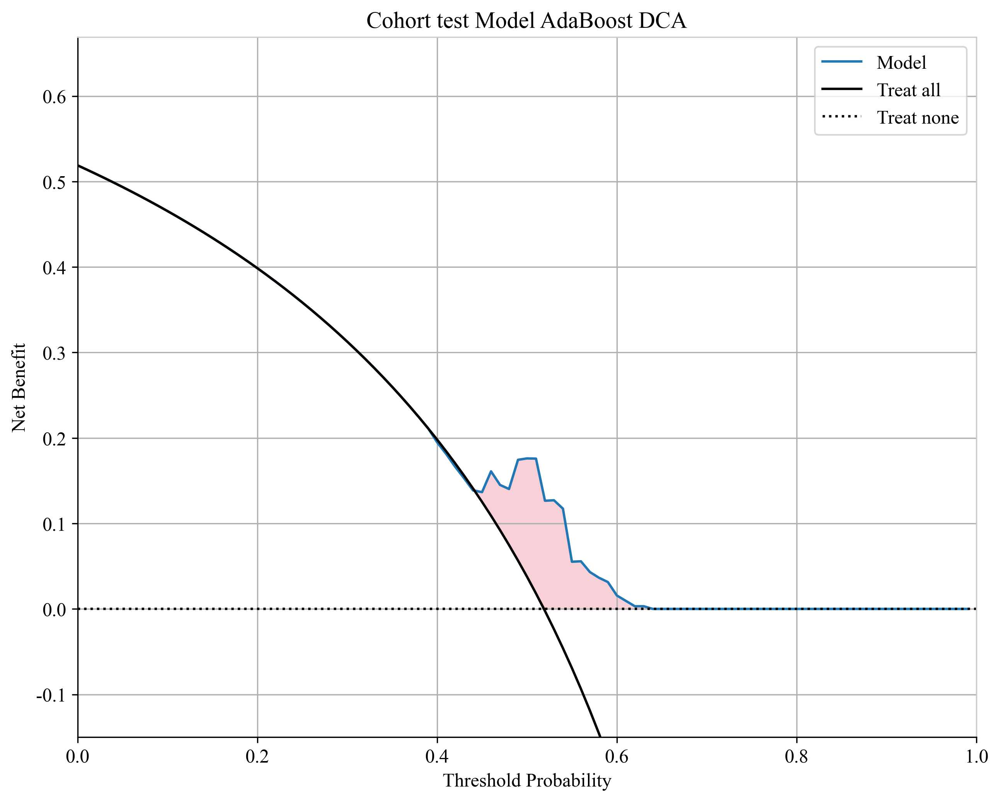

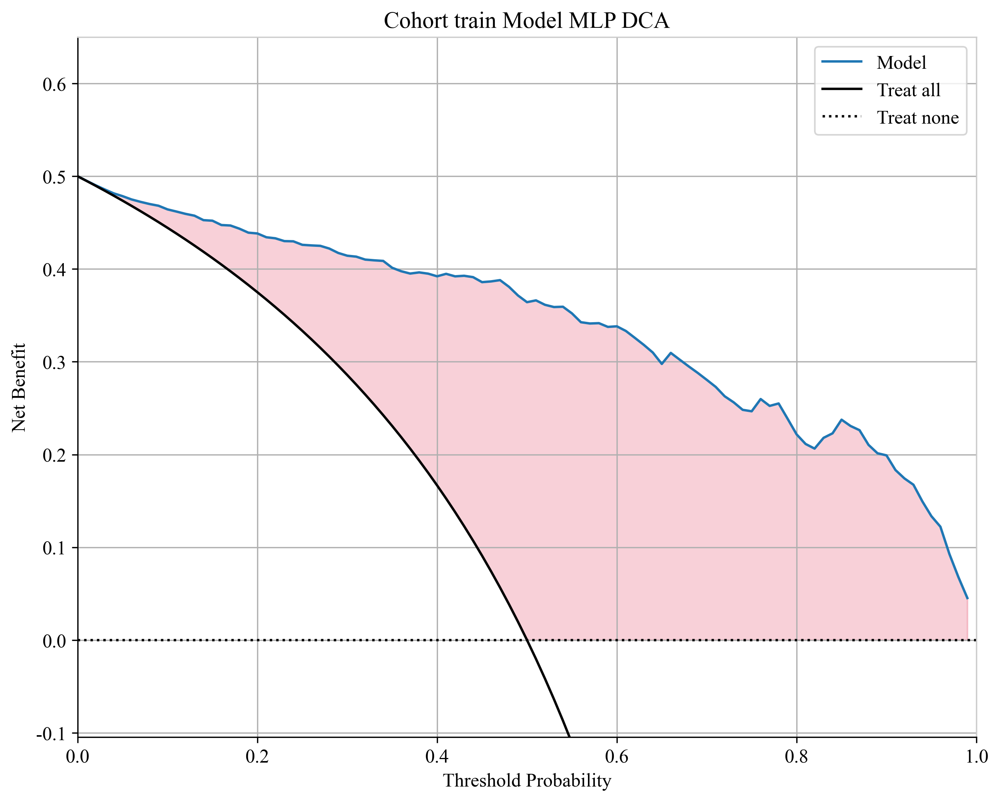

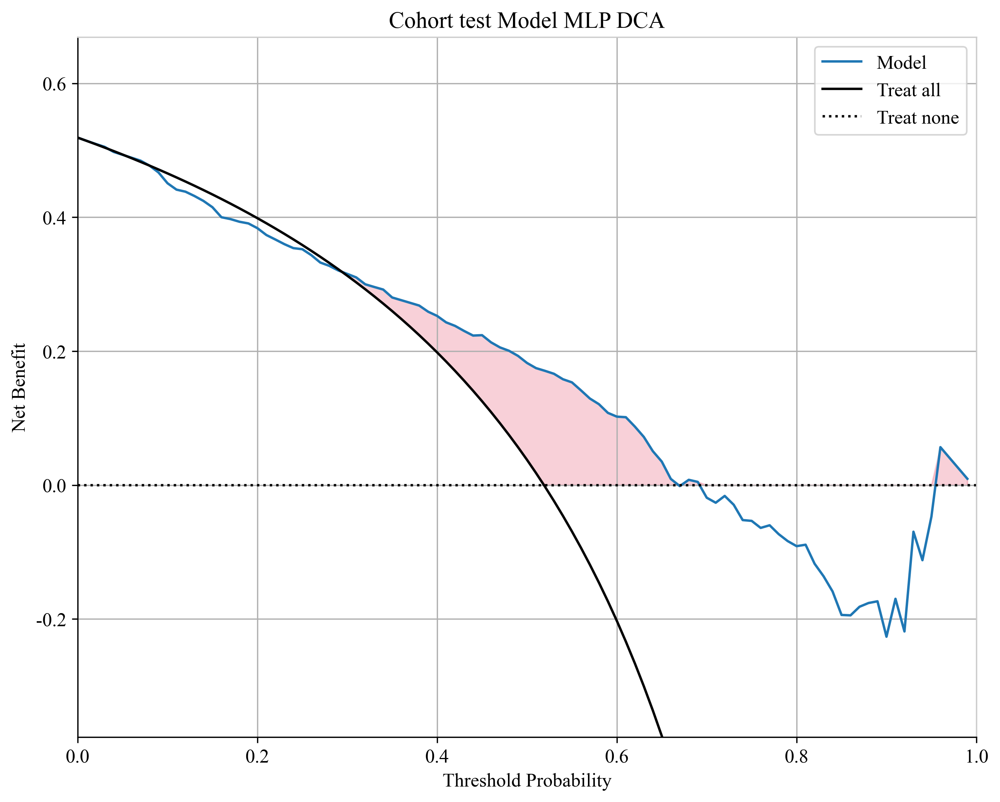

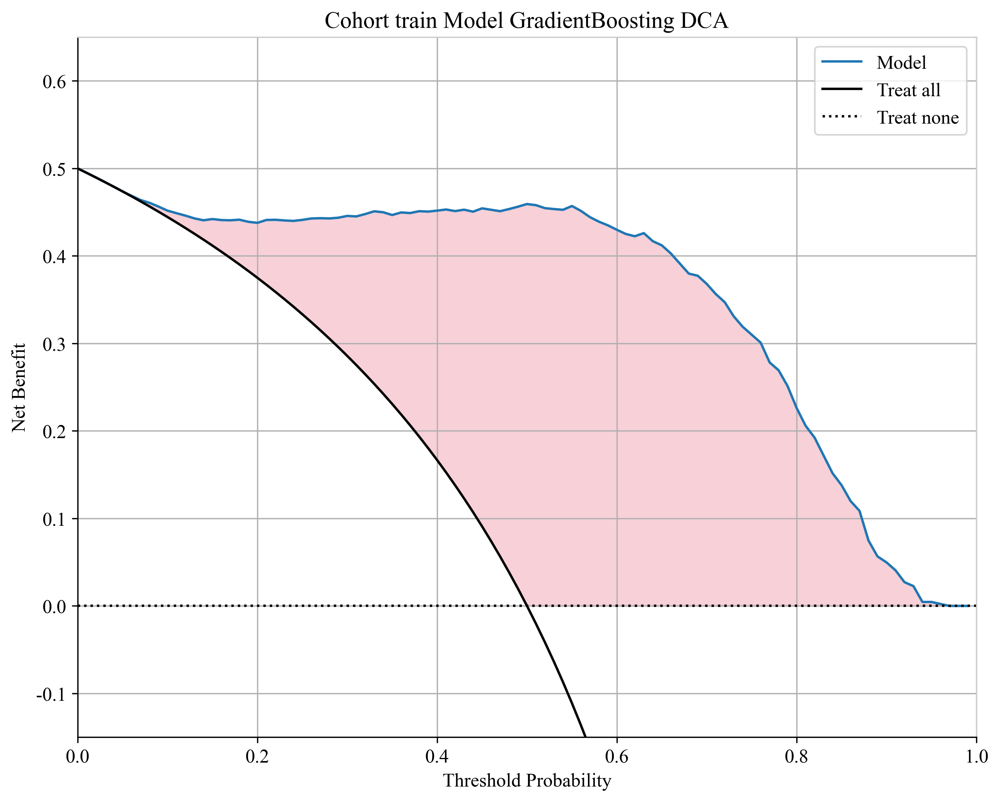

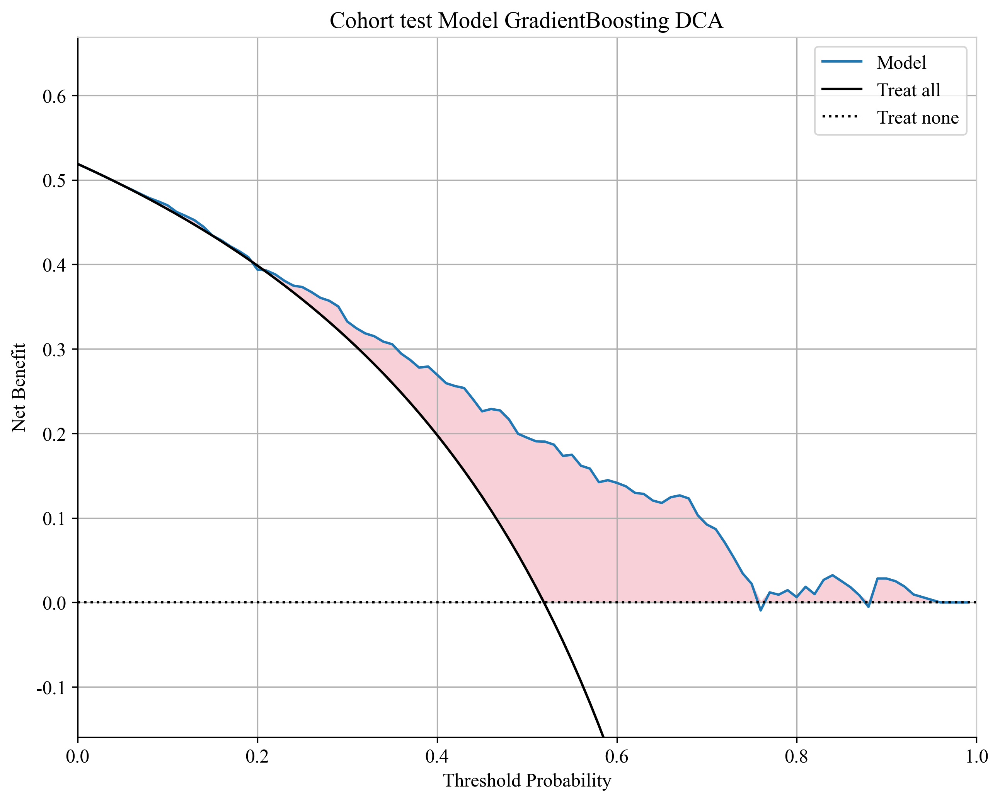

In [37]:
from onekey_algo.custom.components.comp1 import plot_DCA

for pred_score, label in zip(pred_scores, labels):
    pred_test_scores = []
    for sm in sel_model:
        if sm in model_names:
            sel_model_idx = model_names.index(sm)
            okcomp.comp1.plot_DCA(pred_score[sel_model_idx][0][:,1], np.array(y_train_sel[label]),
                                  title=f'Cohort train Model {sm} DCA')
            plt.savefig(f'img/{label}_{task_type}Rad_model_train_{sm}_dca.svg', bbox_inches = 'tight')
            plt.show()
            okcomp.comp1.plot_DCA(pred_score[sel_model_idx][1][:,1], np.array(y_test_sel[label]),
                                  title=f'Cohort test Model {sm} DCA')
            plt.savefig(f'img/{label}_{task_type}Rad_model_test_{sm}_dca.svg', bbox_inches = 'tight')
            plt.show()

### 绘制混淆矩阵

绘制混淆矩阵，[混淆矩阵解释](https://baike.baidu.com/item/%E6%B7%B7%E6%B7%86%E7%9F%A9%E9%98%B5/10087822?fr=aladdin)
`sel_model = ['SVM', 'KNN']`参数为想要绘制的模型对应的参数。

如果需要修改标签到名称的映射，修改`class_mapping={1:'1', 0:'0'}`

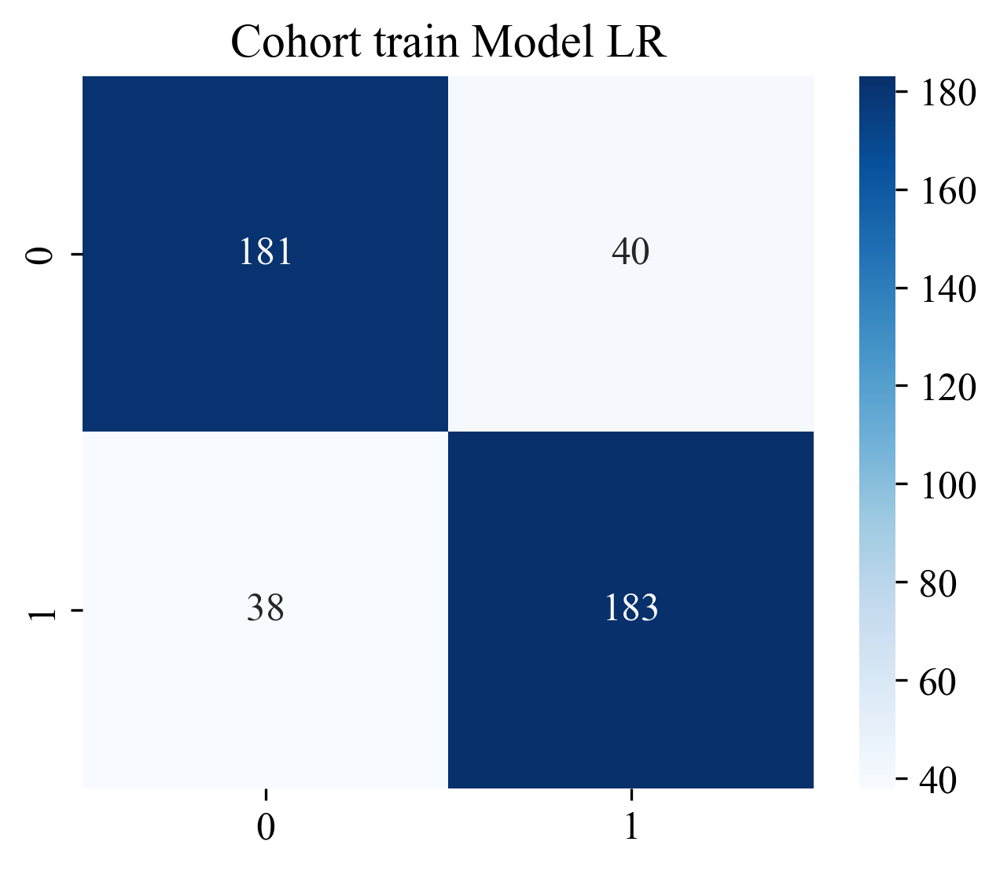

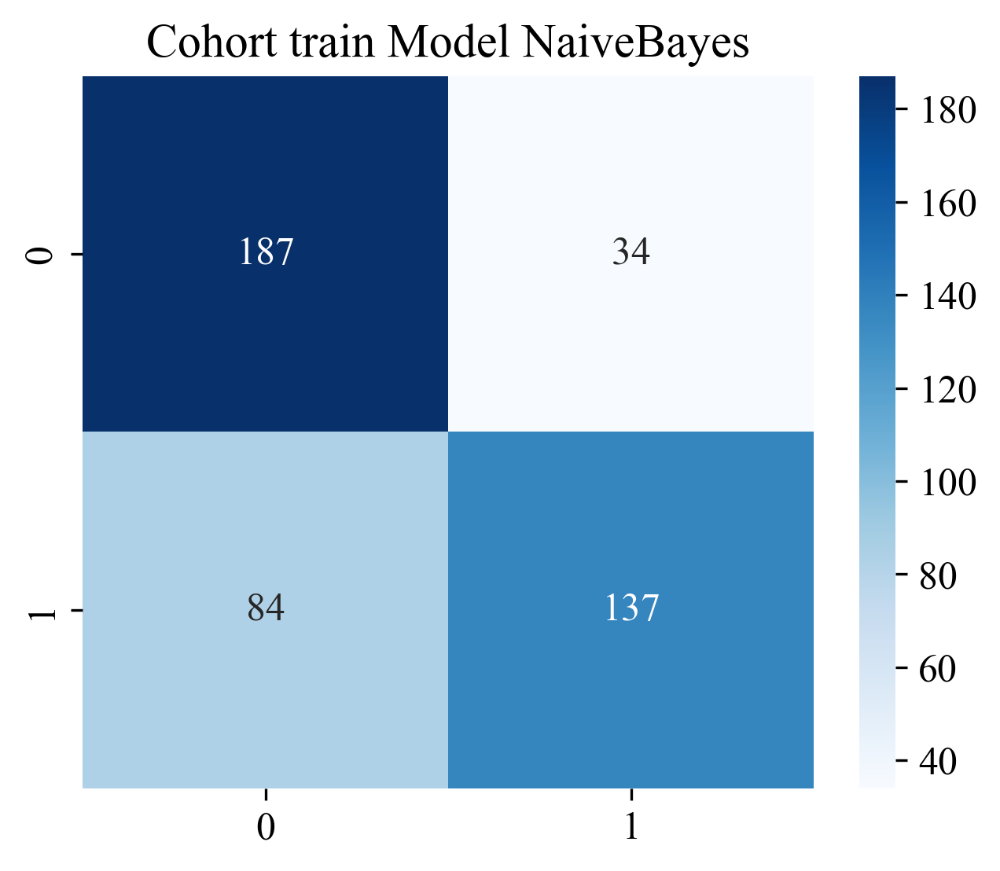

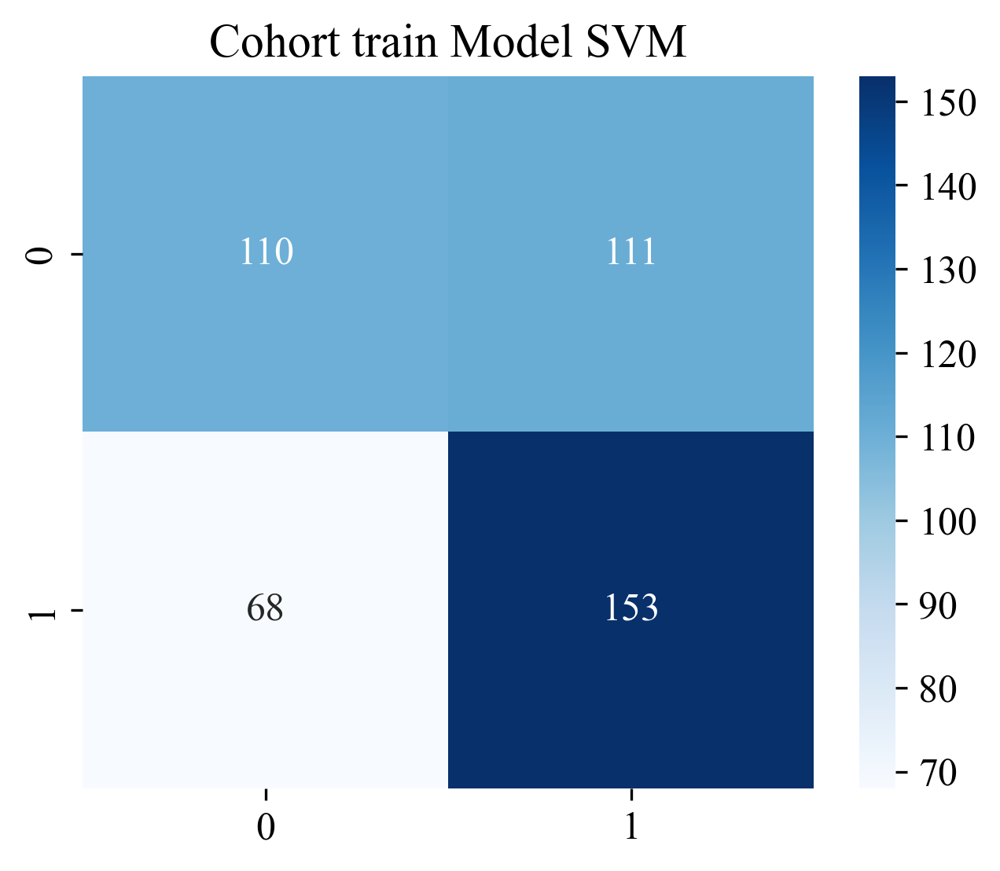

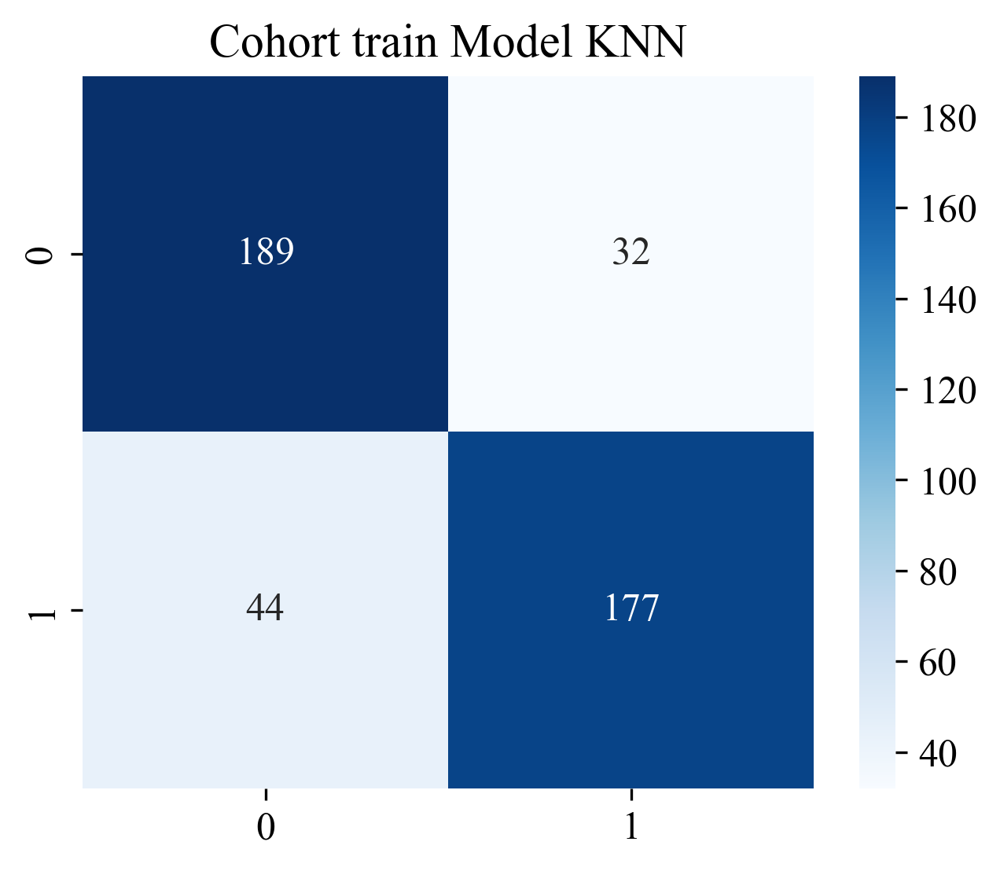

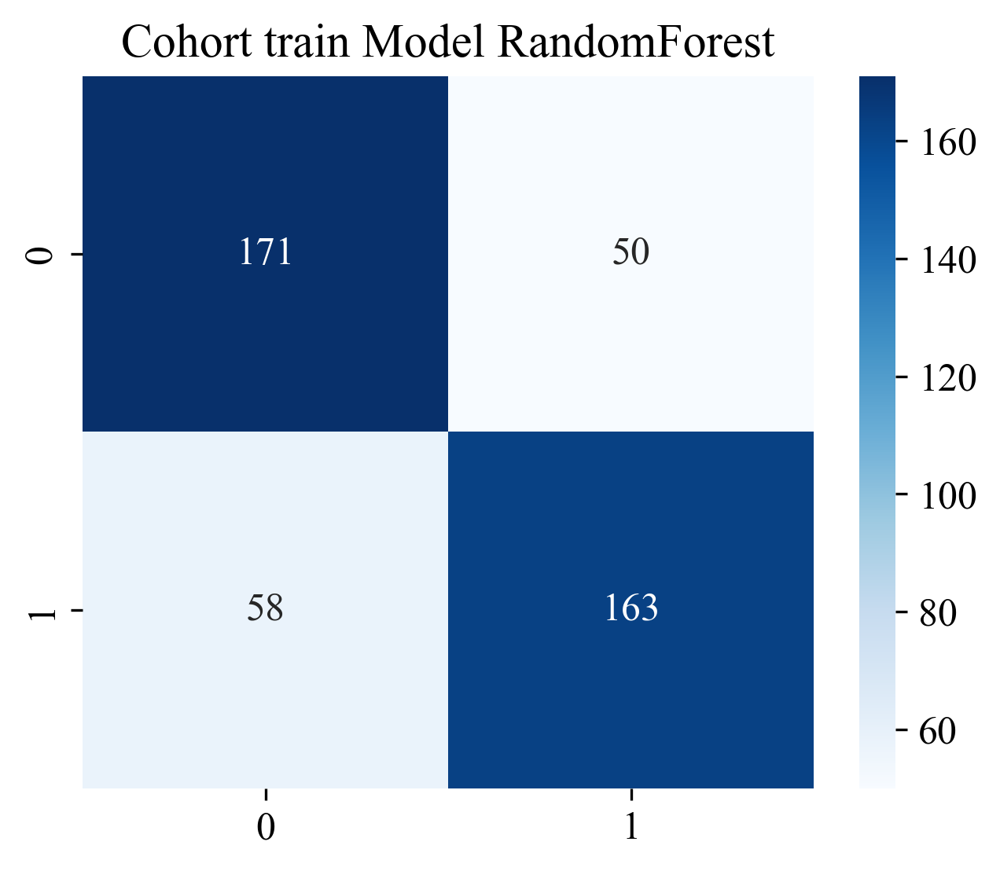

...

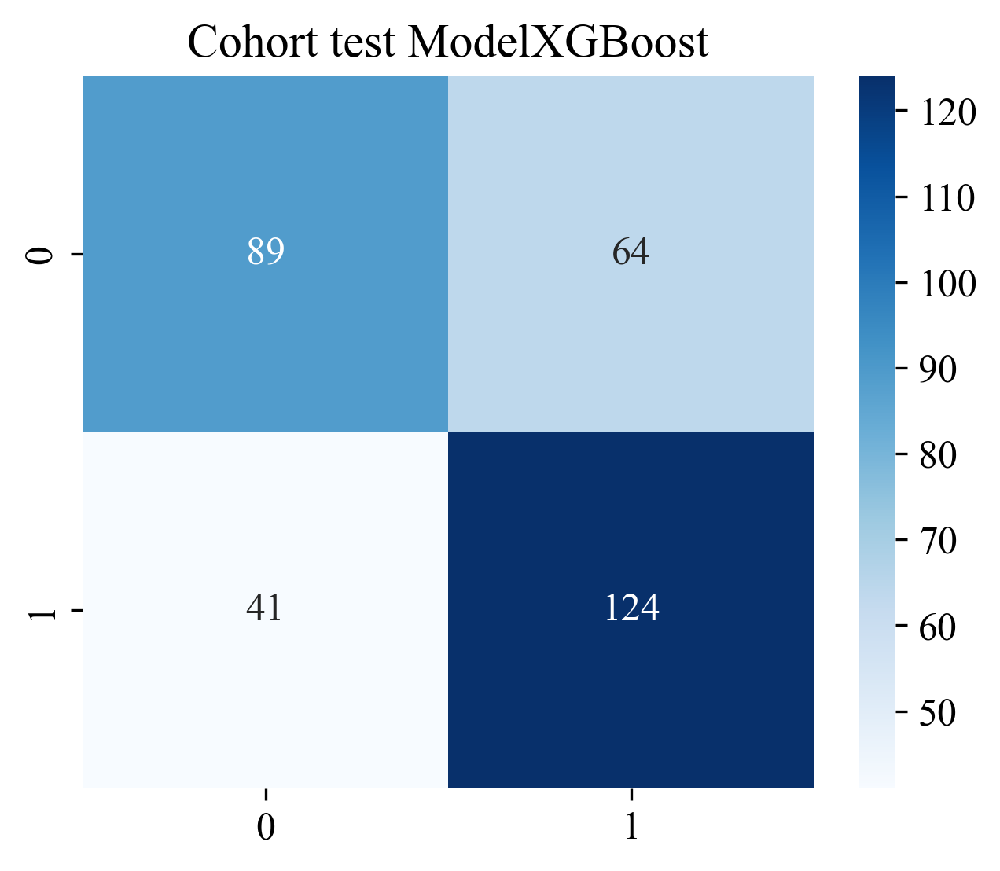

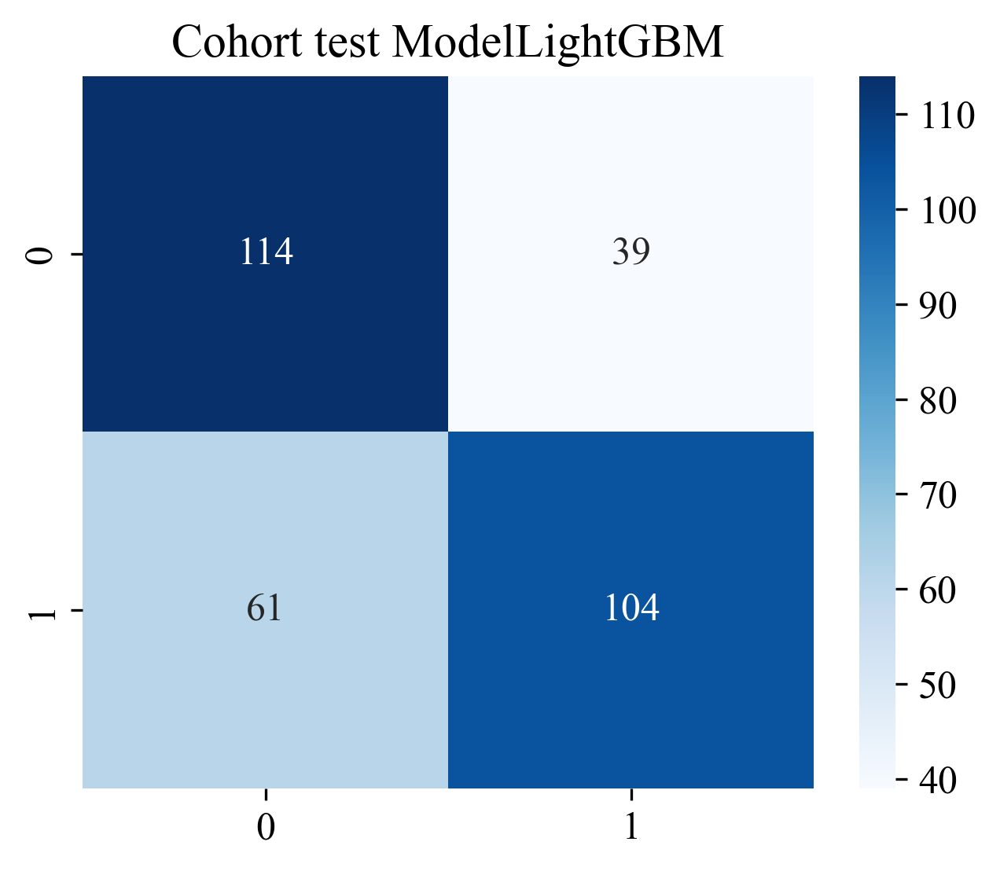

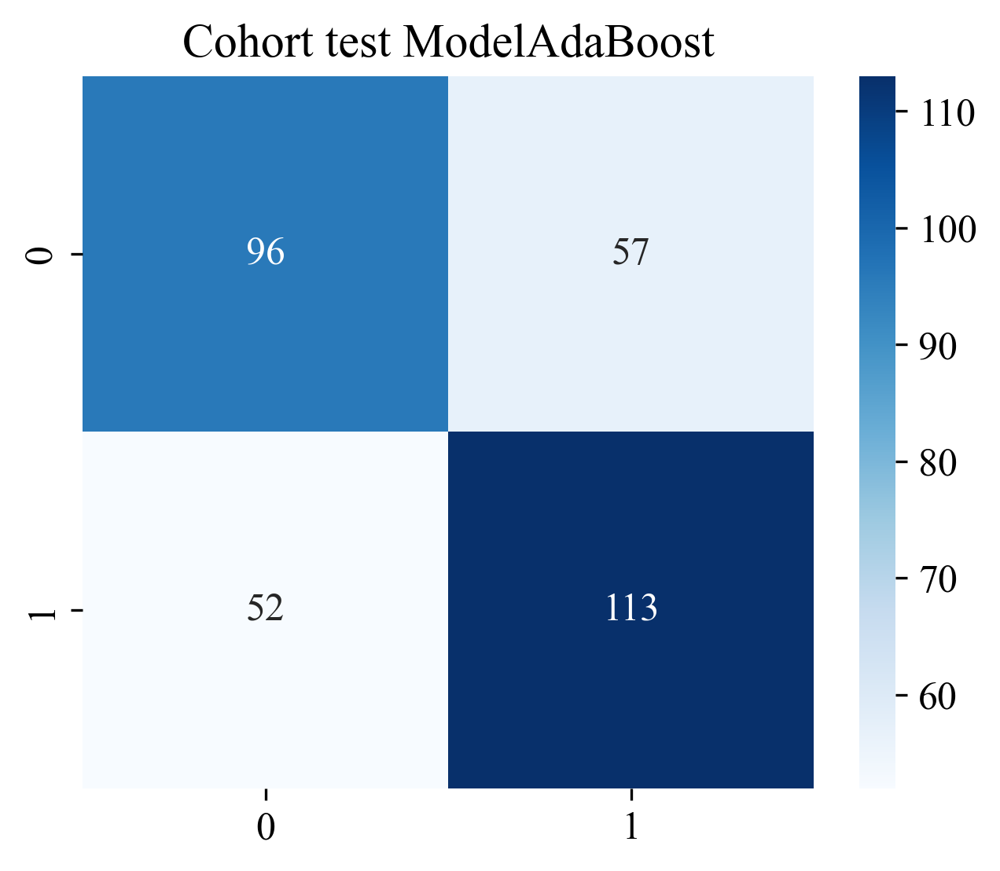

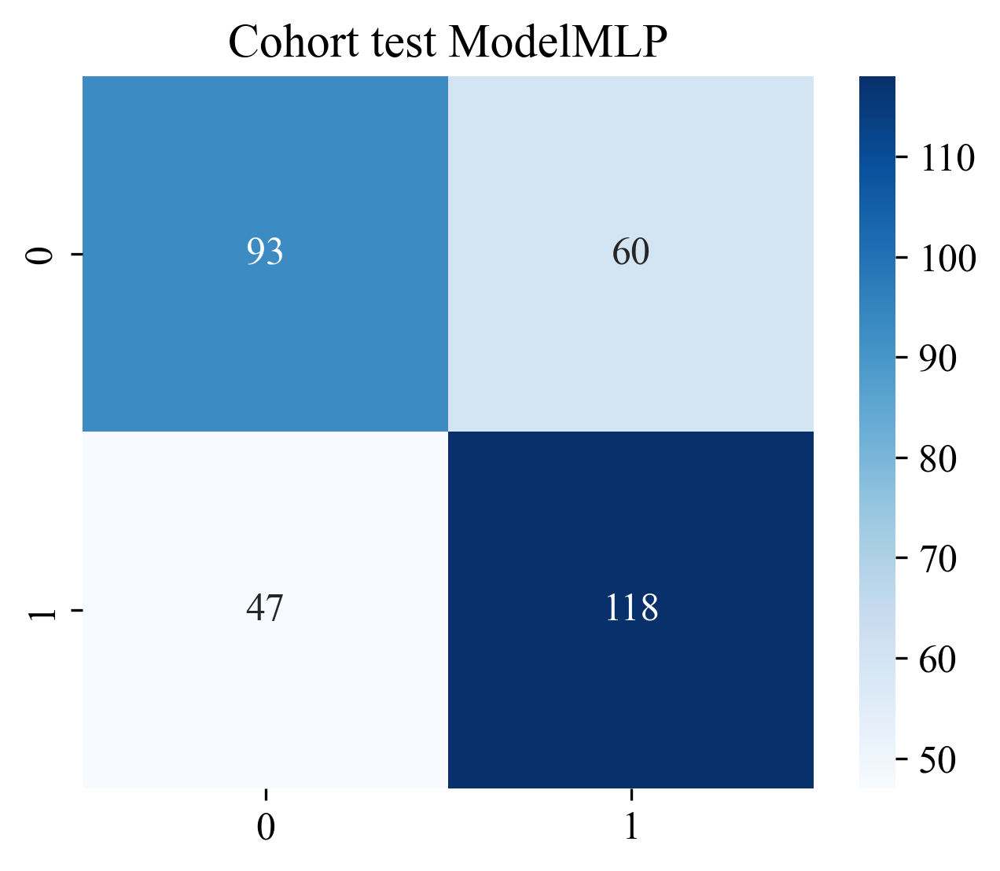

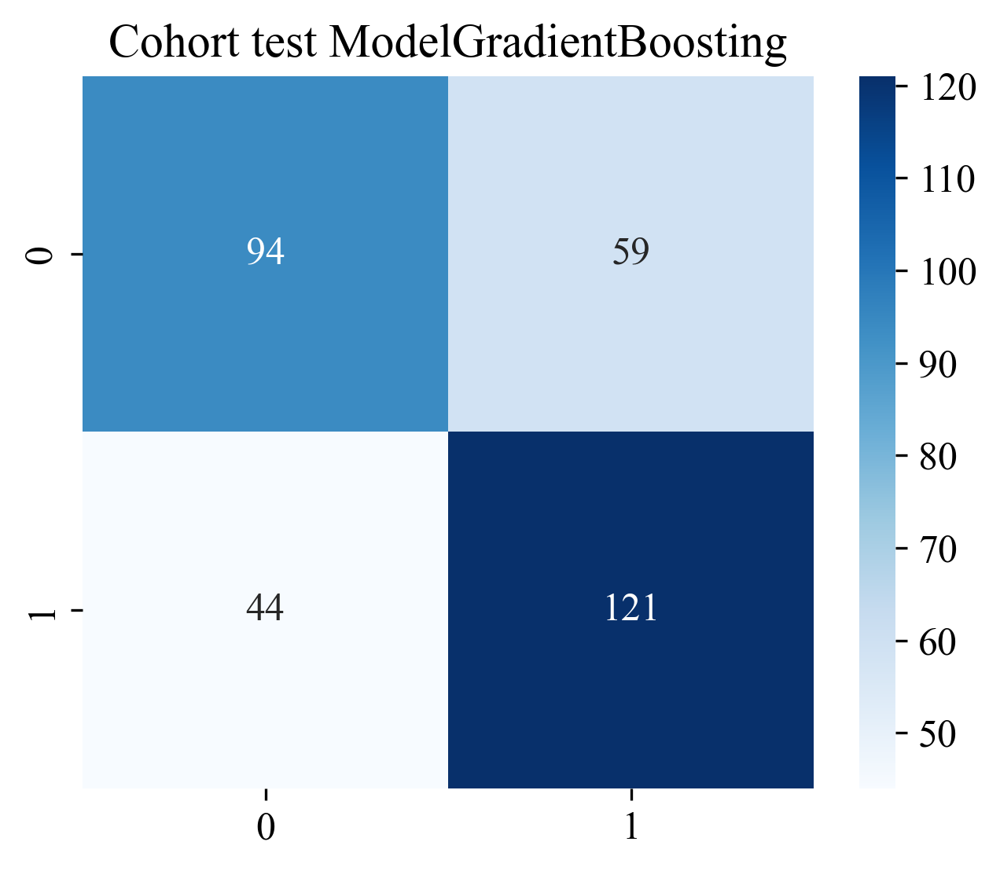

In [38]:
# 设置绘制参数
sel_model = model_names
c_matrix = {}

for sm in sel_model:
    if sm in model_names:
        sel_model_idx = model_names.index(sm)
        for idx, label in enumerate(labels):
            cm = okcomp.comp1.calc_confusion_matrix(predictions[idx][sel_model_idx][0], y_train_sel[label],
#                                                     sel_idx = pred_sel_idx[idx][sel_model_idx],
                                                    class_mapping={1:'1', 0:'0'}, num_classes=2)
            c_matrix[label] = cm
            plt.figure(figsize=(5, 4))
            plt.title(f'Cohort train Model {sm}')
            okcomp.comp1.draw_matrix(cm, norm=False, annot=True, cmap='Blues', fmt='.0f')
            plt.savefig(f'img/{label}_{task_type}Rad_model_train_{sm}_cm.svg', bbox_inches = 'tight')
            plt.show()
            

for sm in sel_model:
    if sm in model_names:
        sel_model_idx = model_names.index(sm)
        for idx, label in enumerate(labels):
            cm = okcomp.comp1.calc_confusion_matrix(predictions[idx][sel_model_idx][1], y_test_sel[label],
#                                                     sel_idx = pred_sel_idx[idx][sel_model_idx],
                                                    class_mapping={1:'1', 0:'0'}, num_classes=2)
            c_matrix[label] = cm
            plt.figure(figsize=(5, 4))
            plt.title(f'Cohort test Model{sm}')
            okcomp.comp1.draw_matrix(cm, norm=False, annot=True, cmap='Blues', fmt='.0f')
            plt.savefig(f'img/{label}_{task_type}Rad_model_test_{sm}_cm.svg', bbox_inches = 'tight')
            plt.show()

### 样本预测直方图

绘制每个样本的预测结果以及对应的真实结果, 图例中label=xx可以修改成自己类别的真实标签。

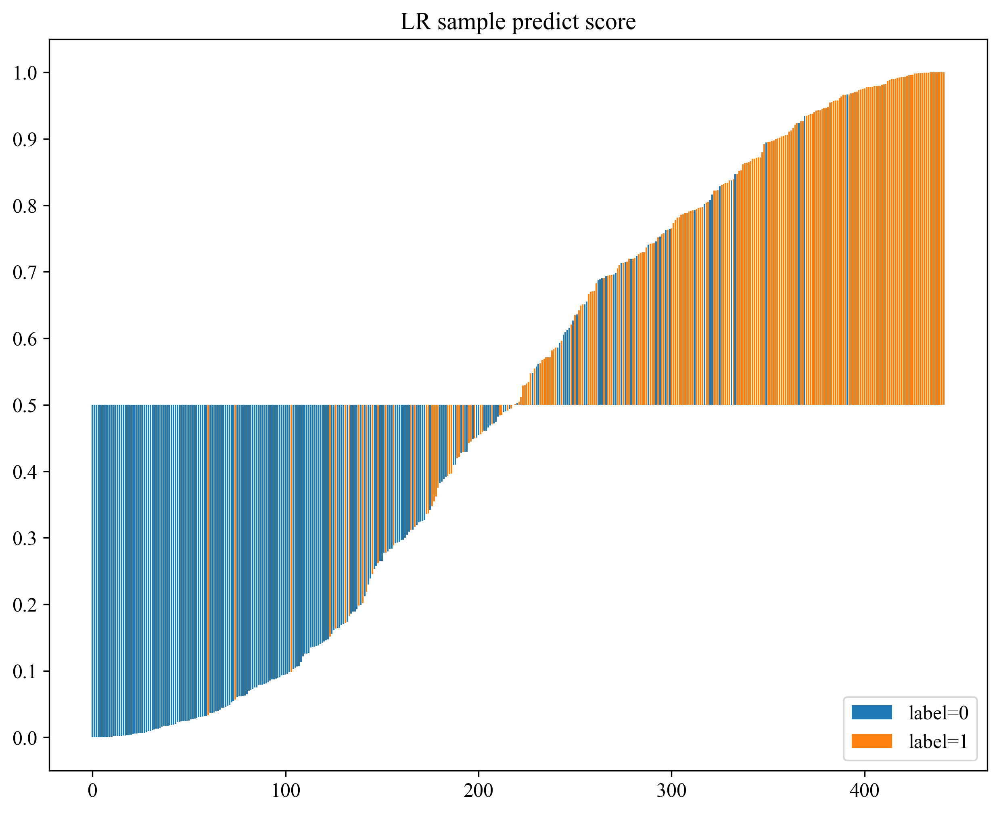

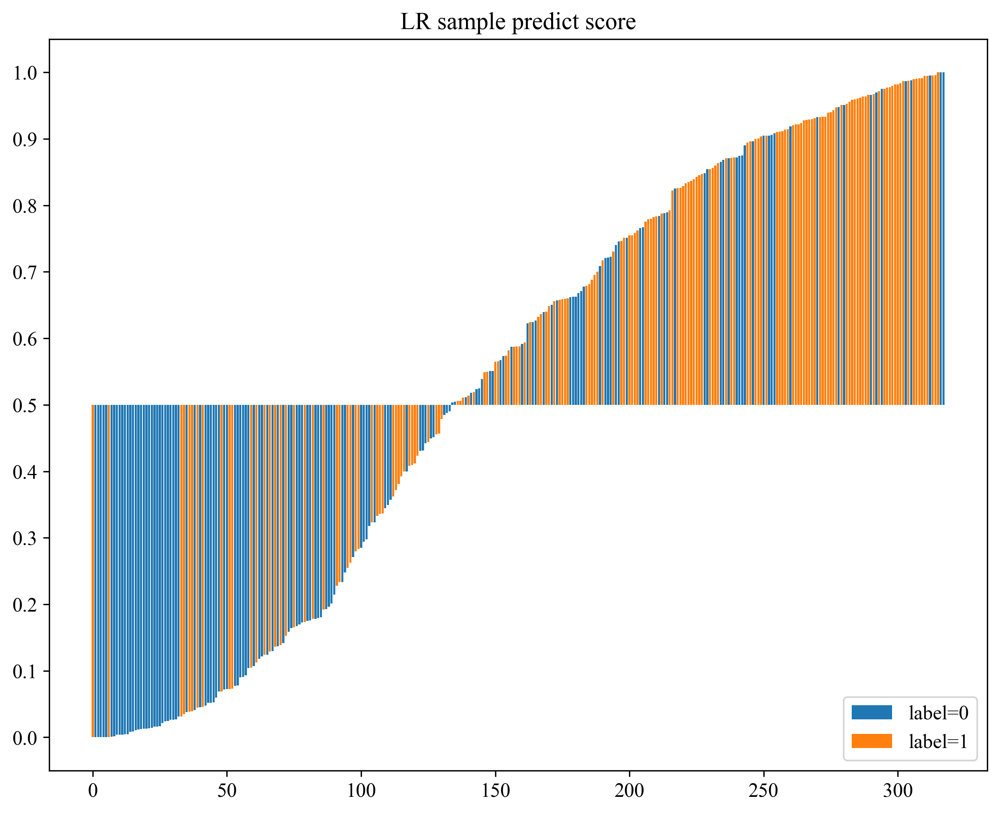

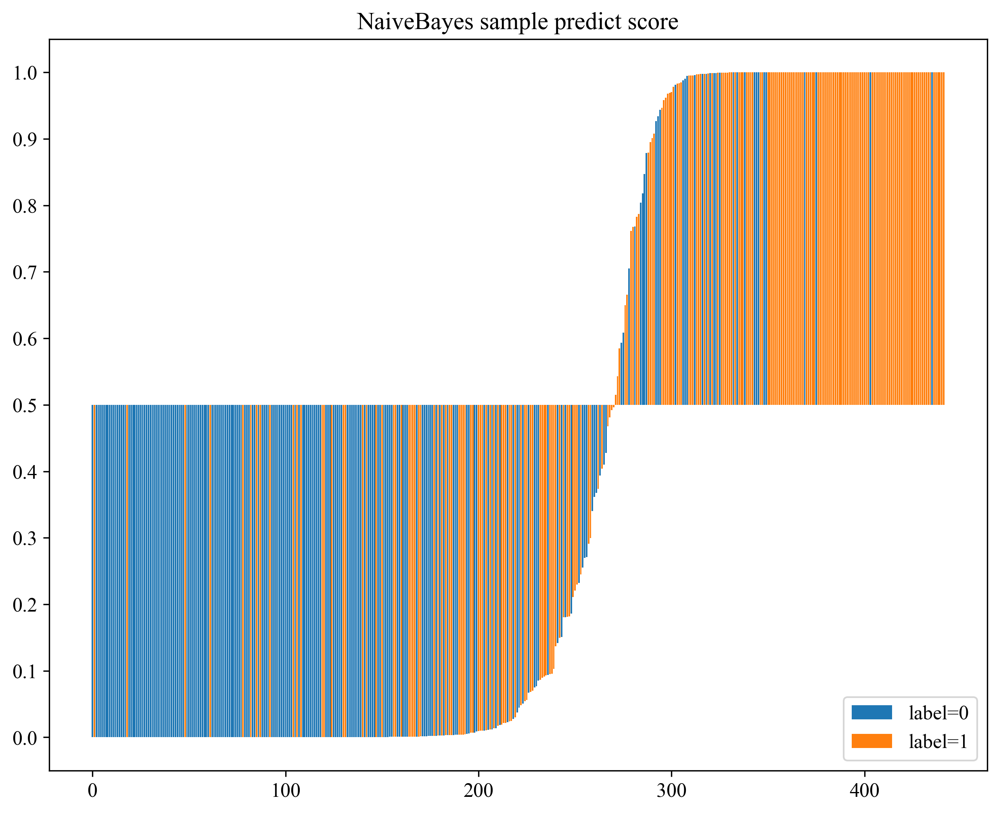

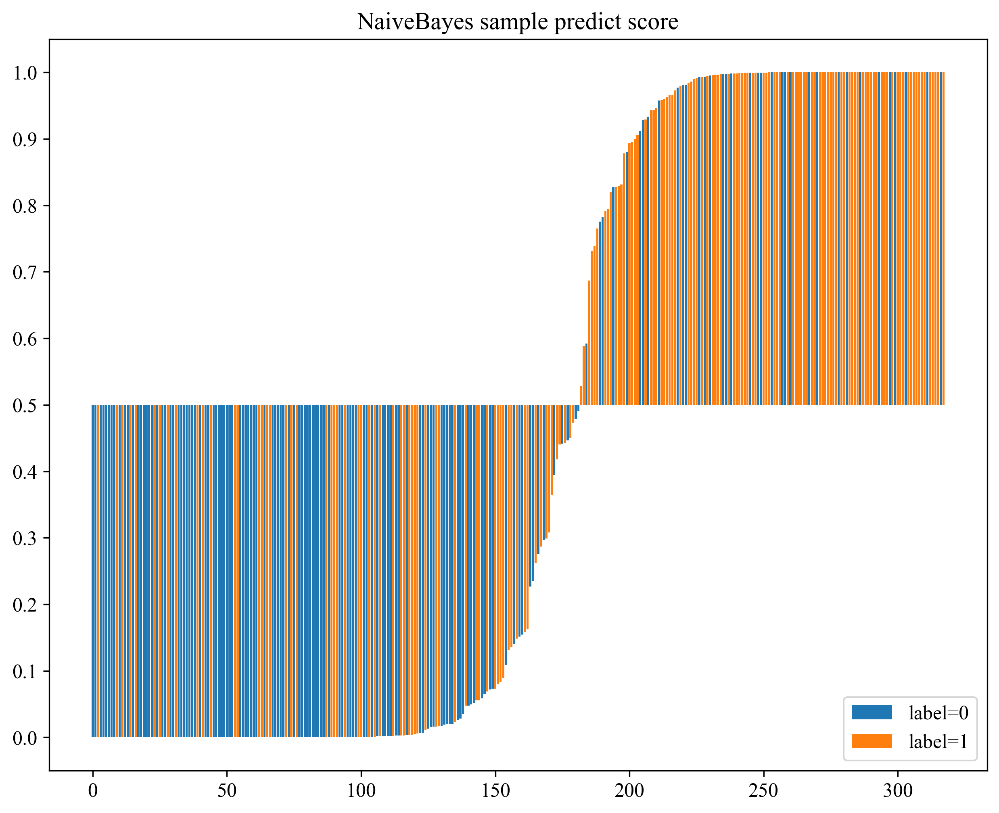

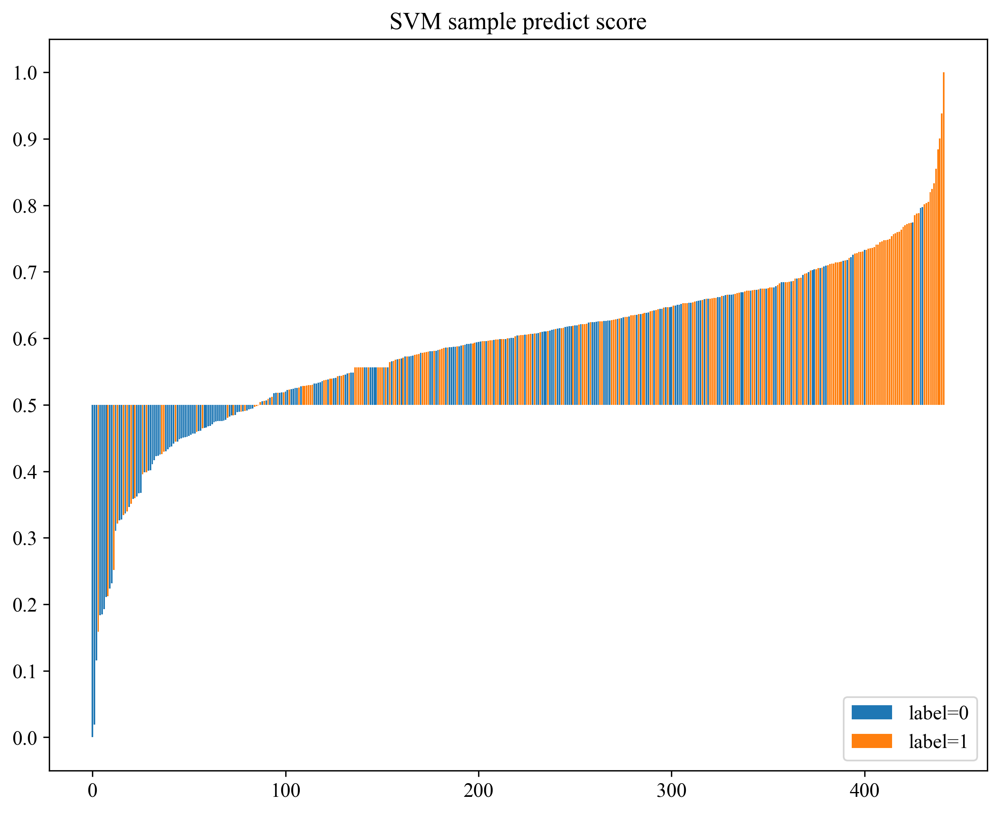

...

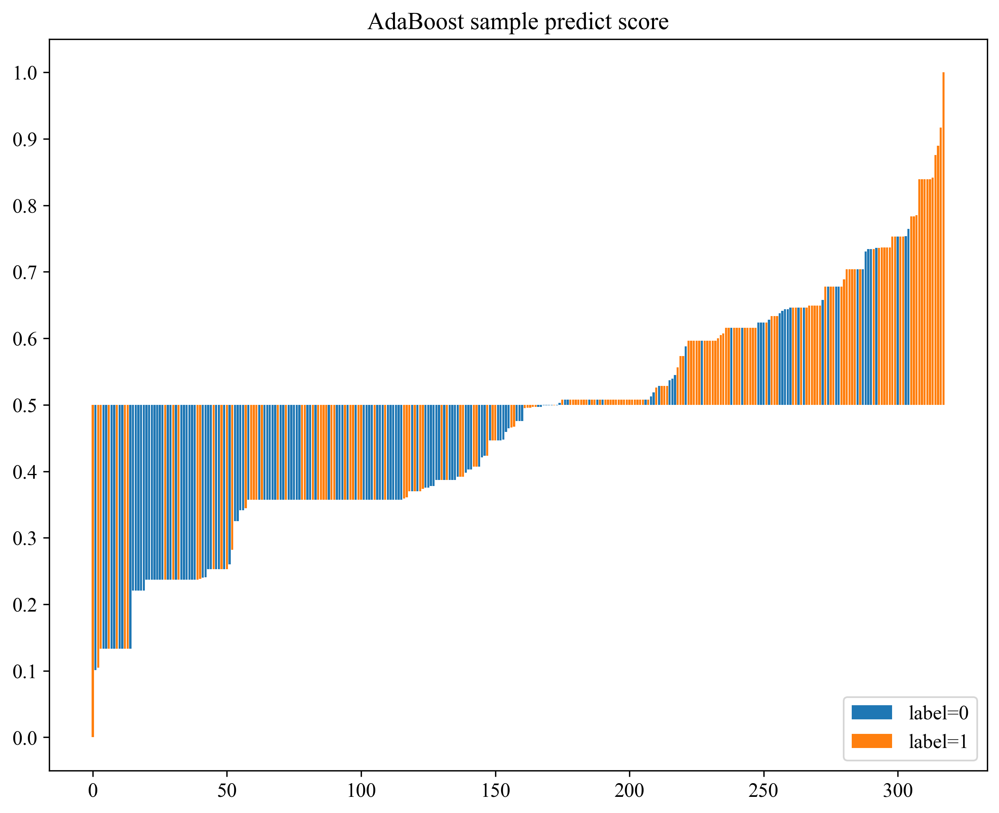

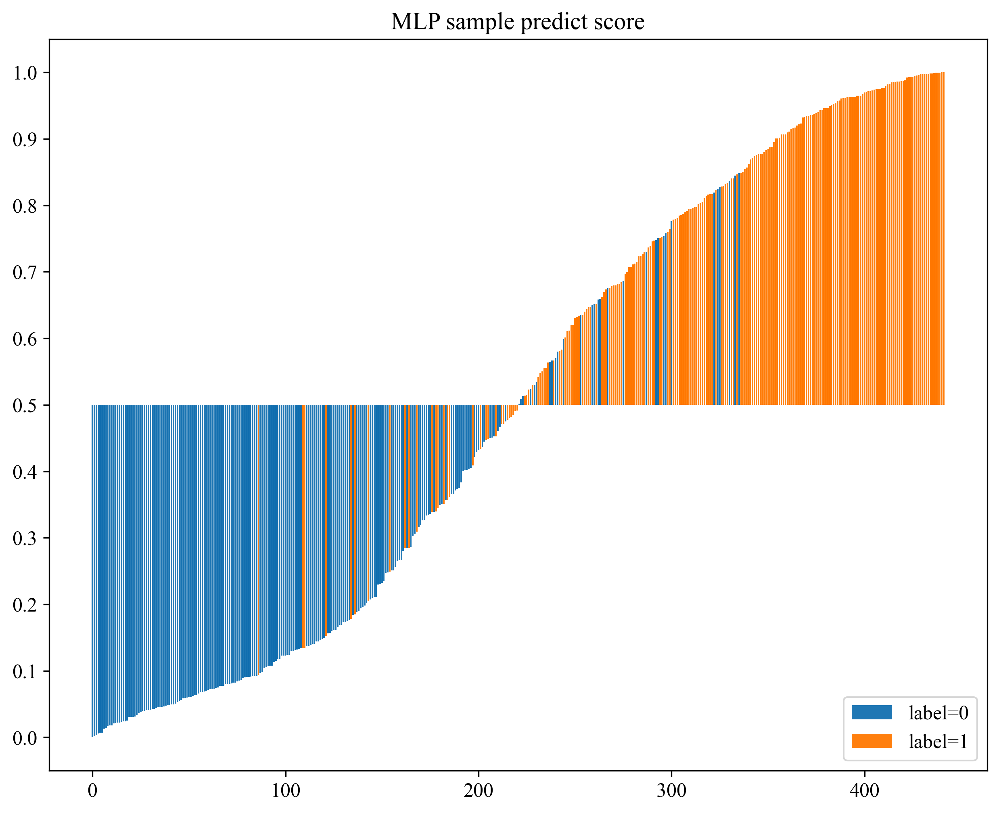

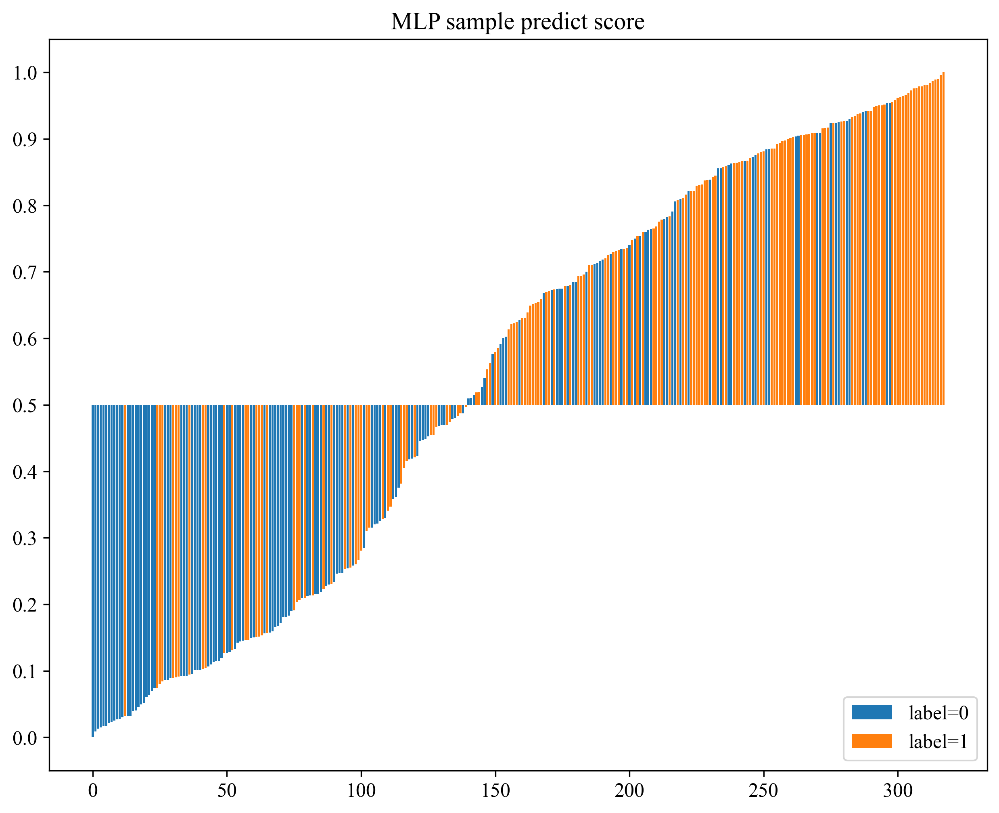

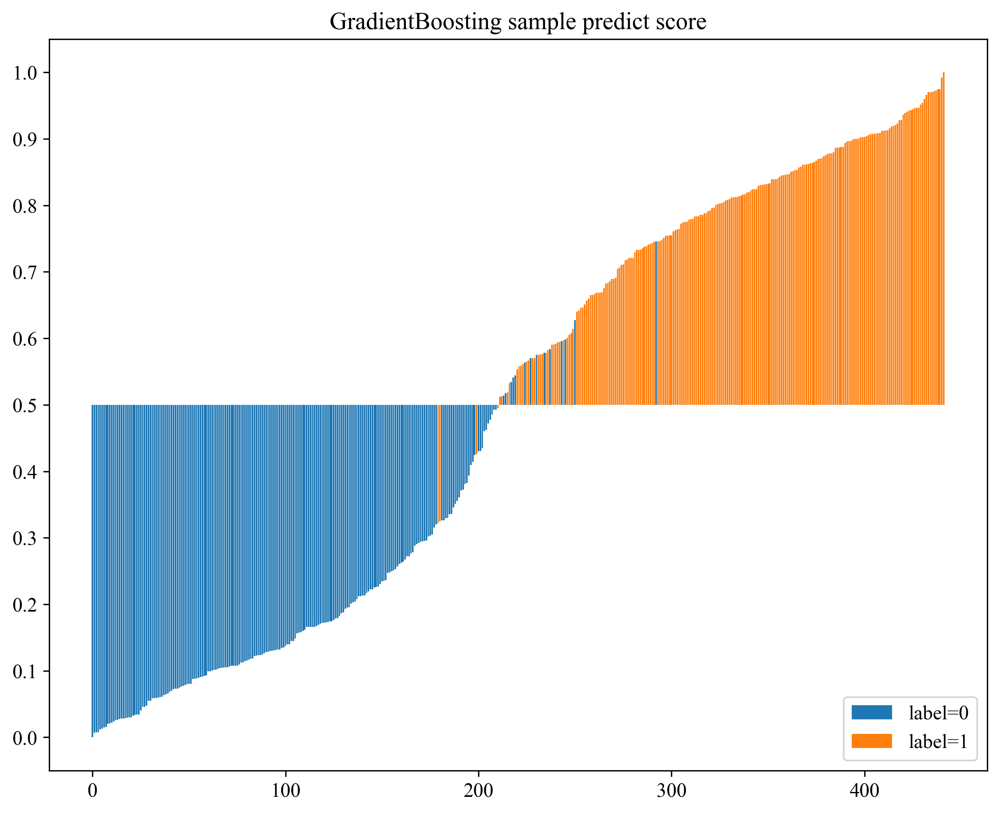

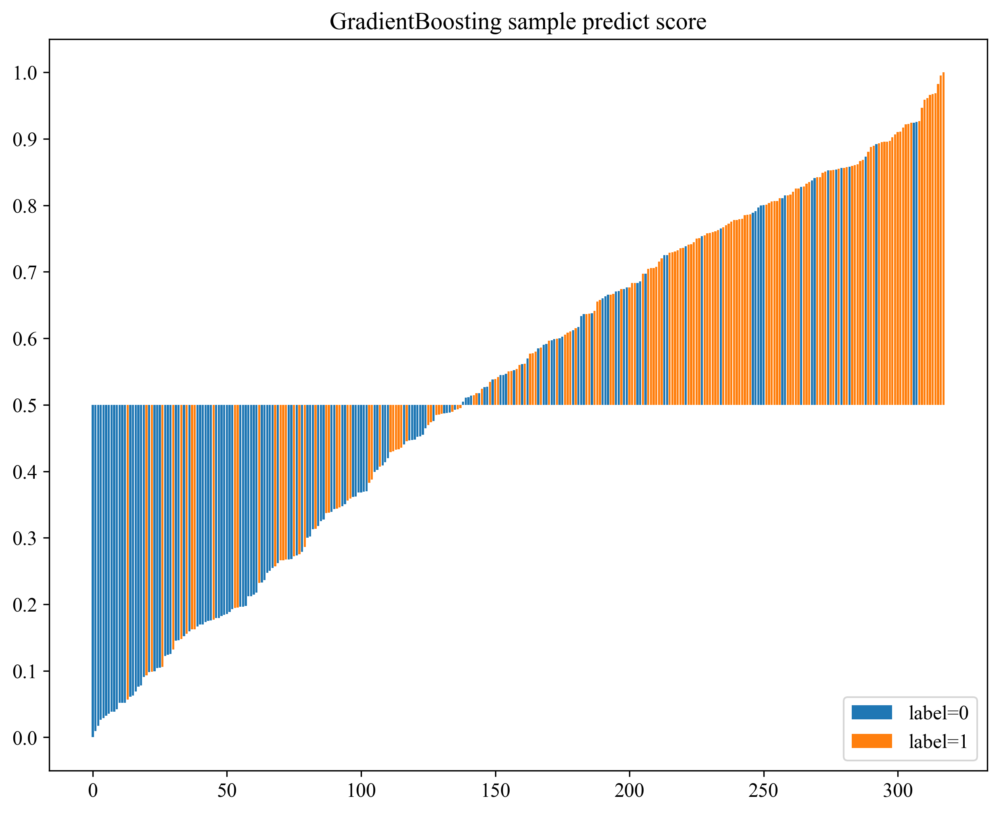

In [39]:
sel_model = model_names
c_matrix = {}

for sm in sel_model:
    if sm in model_names:
        sel_model_idx = model_names.index(sm)
        for idx, label in enumerate(labels):            
            okcomp.comp1.draw_predict_score(pred_scores[idx][sel_model_idx][0], y_train_sel[label])
            plt.title(f'{sm} sample predict score')
            plt.legend(labels=["label=0", "label=1"],loc="lower right") 
            plt.savefig(f'img/{label}_{task_type}Rad_train_{sm}_sample_dis.svg', bbox_inches = 'tight')
            plt.show()
  
            okcomp.comp1.draw_predict_score(pred_scores[idx][sel_model_idx][1], y_test_sel[label])
            plt.title(f'{sm} sample predict score')
            plt.legend(labels=["label=0", "label=1"],loc="lower right") 
            plt.savefig(f'img/{label}_{task_type}Rad_test_{sm}_sample_dis.svg', bbox_inches = 'tight')
            plt.show()

## 保存模型结果

可以把模型预测的标签结果以及每个类别的概率都保存下来。

In [40]:
import os
import numpy as np

os.makedirs('results', exist_ok=True)
sel_model = sel_model

for idx, label in enumerate(labels):
    for sm in sel_model:
        if sm in model_names:
            sel_model_idx = model_names.index(sm)
            target = targets[idx][sel_model_idx]
            # 预测训练集和测试集数据。
            train_indexes = np.reshape(np.array(train_ids), (-1, 1)).astype(str)
#             val_indexes = np.reshape(np.array(val_ids), (-1, 1)).astype(str)
            test_indexes = np.reshape(np.array(test_ids_sel), (-1, 1)).astype(str)
            y_train_pred_scores = target.predict_proba(X_train_sel)
#             y_val_pred_scores = target.predict_proba(X_val_sel)
            y_test_pred_scores = target.predict_proba(X_test_sel)
            columns = ['ID'] + [f"{label}-{i}"for i in range(y_test_pred_scores.shape[1])]
            # 保存预测的训练集和测试集结果
            result_train = pd.DataFrame(np.concatenate([train_indexes, y_train_pred_scores], axis=1), columns=columns)
            result_train.to_csv(f'results/{task_type}{sm}_train.csv', index=False)
#             result_val = pd.DataFrame(np.concatenate([val_indexes, y_val_pred_scores], axis=1), columns=columns)
#             result_val.to_csv(f'results/{task_type}Rad_{sm}_val.csv', index=False)
            result_test = pd.DataFrame(np.concatenate([test_indexes, y_test_pred_scores], axis=1), columns=columns)
            result_test.to_csv(f'results/{task_type}{sm}_test.csv', index=False)